# What is single model for classification and regression?
<p style="text-align: justify">A single model for both classification and regression is a machine learning model that can handle both classification and regression tasks. This type of model is often called a "hybrid" or "multi-task" model because it can perform multiple tasks simultaneously.</p>

<p style="text-align: justify">Classification is a type of machine learning task where the goal is to predict a categorical label or class for a given input, while regression is a type of task where the goal is to predict a continuous numerical value for a given input.</p>
<p style="text-align: justify">By using a single model for both tasks, the model can share information and learn common features between the two tasks, which can improve its overall performance. This is especially useful when the two tasks are related, as the same input data can be used to make predictions for both classification and regression.</p>

## Goal
* Main focus here is to create a single model for classification and regression.
* This is the dataset where we have a target column `diagnosis` for classification 
* We will consider ``area_mean`` column as a target of our regression task (for testing purpose)
* Build a model that can give us the classification and regression output simultaneously
* Let's go

<h1 style="color:purple"><b>If you find this notebook helpful please upvote</b></h1>

## Import necessary libraries

In [11]:
import numpy as np
import pandas as pd
#from pandas.tools import plotting
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
init_notebook_mode(connected=True)  
import plotly.figure_factory as ff

import tensorflow as tf
from tensorflow.keras.regularizers import l2
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelBinarizer
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, LSTM, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, CSVLogger
# this is for high quality images
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 150

In [12]:
url = '/kaggle/input/all-data-dea1-v2/all_data_DEA1_v1.csv'
df=pd.read_csv(url)
df = df.dropna()
df.head()

,Time,HVDC_left,HVDC_Right,Duty_Cycle,Frequency,SV1,SV2,SR1,SR2,S1_Angle,S2_Angle,F1,F2,D,Total_Displacement,State
0,0.05,0.0,3.5,30,1,14,1,20756570.0,294336000.0,70,56,152.444444,121.955556,0.136111,0.136111,L
1,0.10,0.0,3.5,30,1,15,62,20756570.0,4541901.5,70,56,152.444444,121.955556,0.136111,0.272222,L
2,0.15,0.0,3.5,30,1,14,1,19353602.0,294336000.0,70,56,152.444444,121.955556,0.136111,0.408333,L
3,0.20,0.0,3.5,30,1,14,40,20756570.0,7077599.5,70,56,152.444444,121.955556,0.136111,0.544444,L
4,0.25,0.0,3.5,30,1,14,1,20756570.0,294336000.0,70,56,152.444444,121.955556,0.136111,0.680555,L


### Load the dataset

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72000 entries, 0 to 71999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Time                72000 non-null  float64
 1   HVDC_left           72000 non-null  float64
 2   HVDC_Right          72000 non-null  float64
 3   Duty_Cycle          72000 non-null  int64  
 4   Frequency           72000 non-null  int64  
 5   SV1                 72000 non-null  int64  
 6   SV2                 72000 non-null  int64  
 7   SR1                 72000 non-null  float64
 8   SR2                 72000 non-null  float64
 9   S1_Angle            72000 non-null  int64  
 10  S2_Angle            72000 non-null  int64  
 11  F1                  72000 non-null  float64
 12  F2                  72000 non-null  float64
 13  D                   72000 non-null  float64
 14  Total_Displacement  72000 non-null  float64
 15  State               72000 non-null  object 
dtypes: f

### Delete unnecessay columns

In [14]:
df.describe()

,Time,HVDC_left,HVDC_Right,Duty_Cycle,Frequency,SV1,SV2,SR1,SR2,S1_Angle,S2_Angle,F1,F2,D,Total_Displacement
count,72000.000000,72000.000000,72000.000000,72000.000000,72000.000000,72000.000000,72000.000000,7.200000e+04,7.200000e+04,72000.000000,72000.000000,72000.000000,72000.000000,7.200000e+04,72000.000000
mean,1800.025000,0.625597,0.625597,35.000000,2.000000,13.855736,14.004111,6.494254e+07,6.428728e+07,66.324042,66.359653,144.441141,144.518694,7.448518e-02,2533.357219
std,1039.237701,1.402536,1.402536,4.082511,0.816502,10.493080,10.783433,1.018314e+08,1.013840e+08,6.213298,6.225571,13.520504,13.547240,8.153853e-02,1553.156065
min,0.050000,0.000000,0.000000,30.000000,1.000000,1.000000,1.000000,3.022382e+06,3.022382e+06,0.000000,0.000000,121.955556,117.600000,3.930000e-08,0.136111
25%,900.037500,0.000000,0.000000,30.000000,1.000000,14.000000,14.000000,1.935360e+07,1.935360e+07,56.000000,56.000000,121.955556,121.955556,3.930000e-08,1102.393179
50%,1800.025000,0.000000,0.000000,35.000000,2.000000,14.000000,14.000000,2.075657e+07,2.075657e+07,70.000000,70.000000,152.444444,152.444444,1.944448e-02,2608.812509
75%,2700.012500,0.000000,0.000000,40.000000,3.000000,15.000000,15.000000,2.075657e+07,2.075657e+07,70.000000,70.000000,152.444444,152.444444,1.361111e-01,3738.797092
max,3600.000000,4.000000,4.000000,40.000000,3.000000,89.000000,90.000000,2.943360e+08,2.943360e+08,73.000000,73.000000,158.977778,158.977778,2.916666e-01,5362.933060


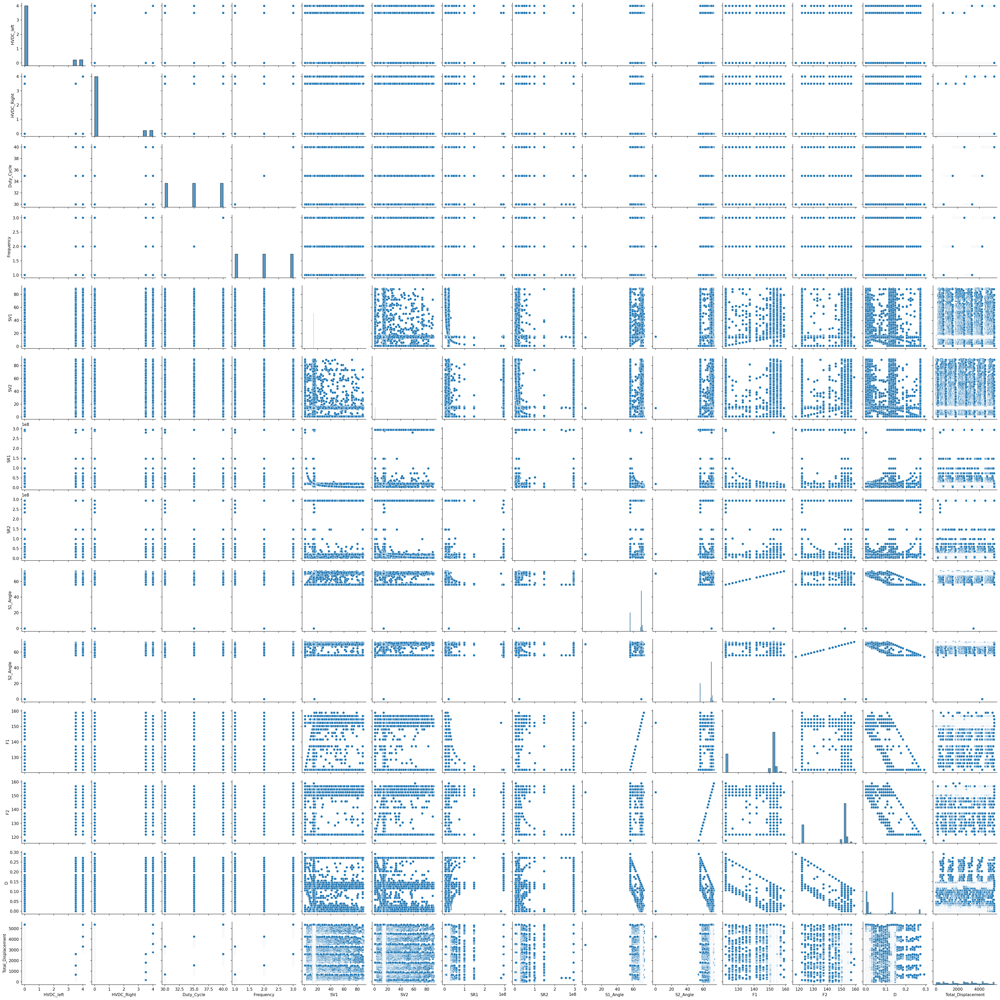

In [15]:
#Correlation between features
features = df.iloc[:,1:]
sns.pairplot(features) 
plt.show()

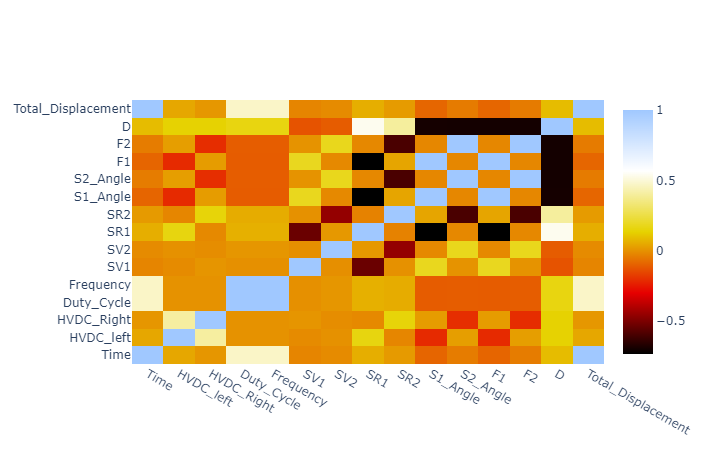

In [16]:
corelation = df.corr()
data = [go.Heatmap(z = np.array(corelation.values),
                   x = np.array(corelation.columns),
                   y = np.array(corelation.columns),
                     colorscale='Blackbody',)
       ]
py.iplot(data)

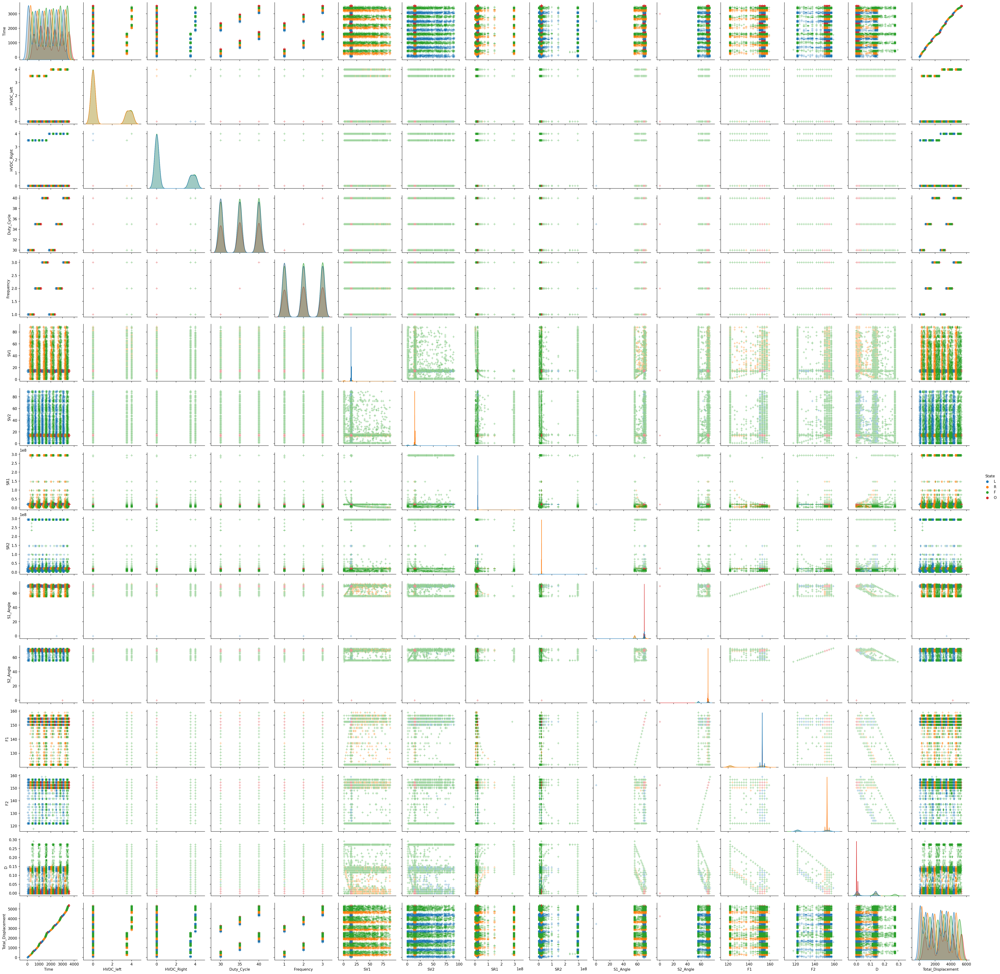

In [17]:
g = sns.pairplot(df, hue='State', markers='+')
plt.show()

<AxesSubplot:>

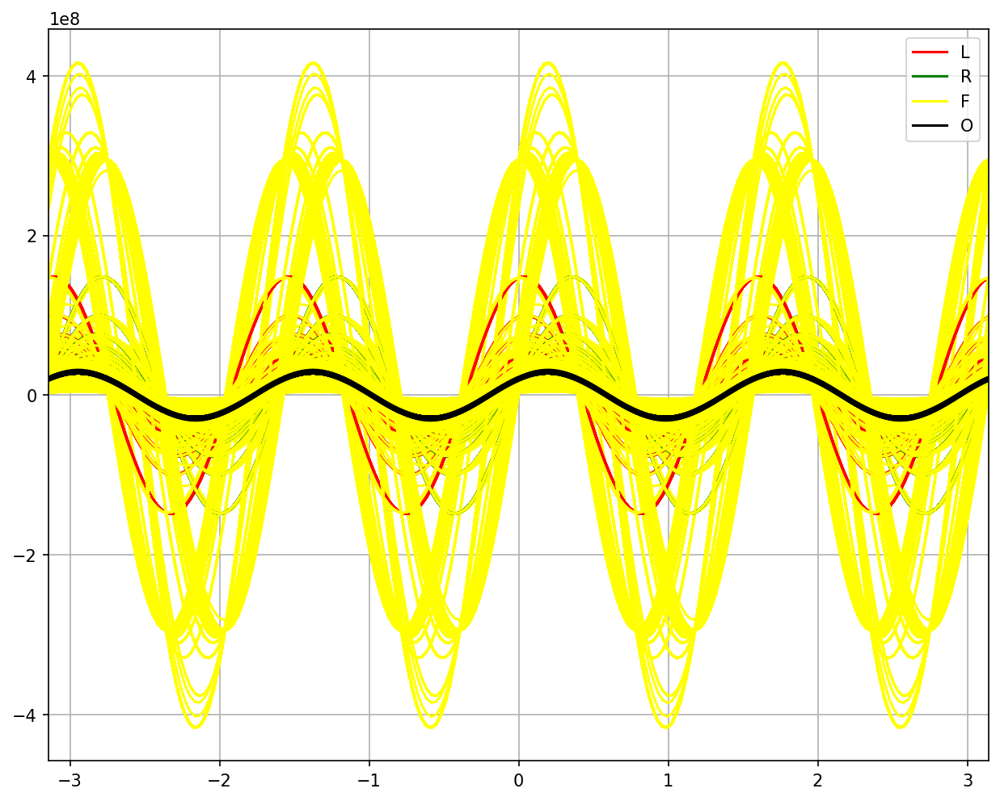

In [18]:
#Andrew's curve
#https://www.kaggle.com/code/ranjeetjain3/visualization-machine-learning-deep-learning
plt.subplots(figsize = (10,8))
pd.plotting.andrews_curves(df, "State", color=['red', 'green', 'yellow', 'black'])

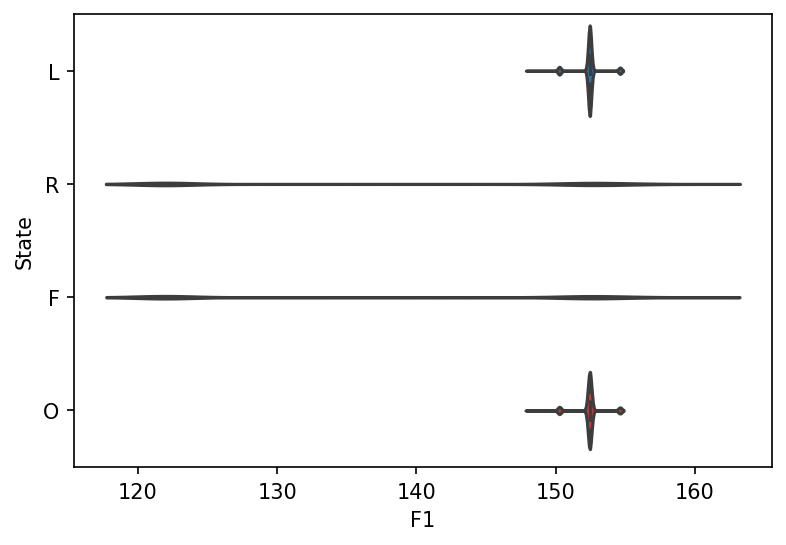

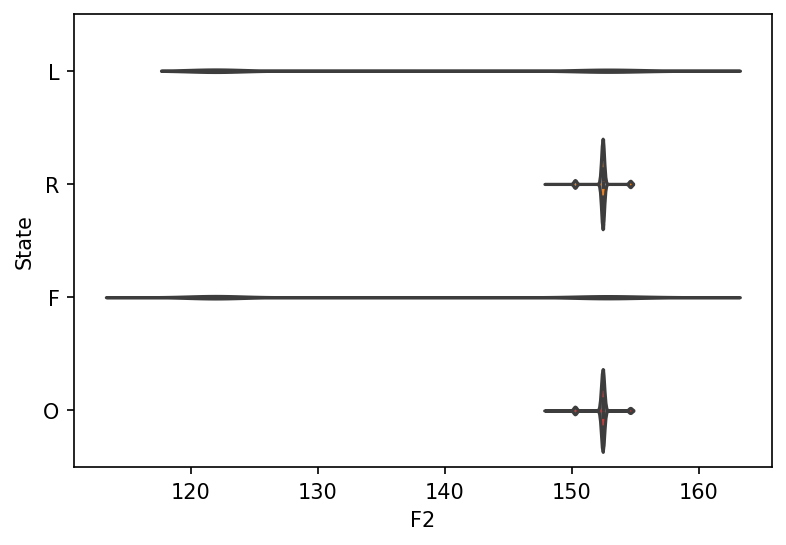

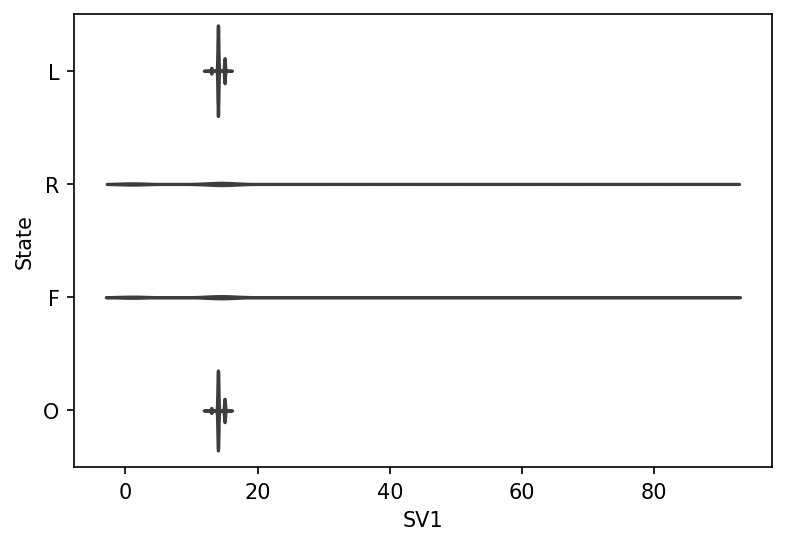

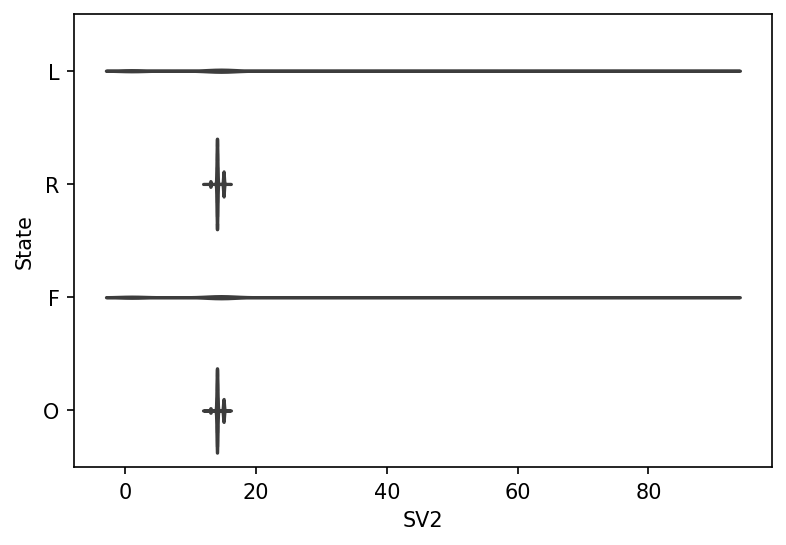

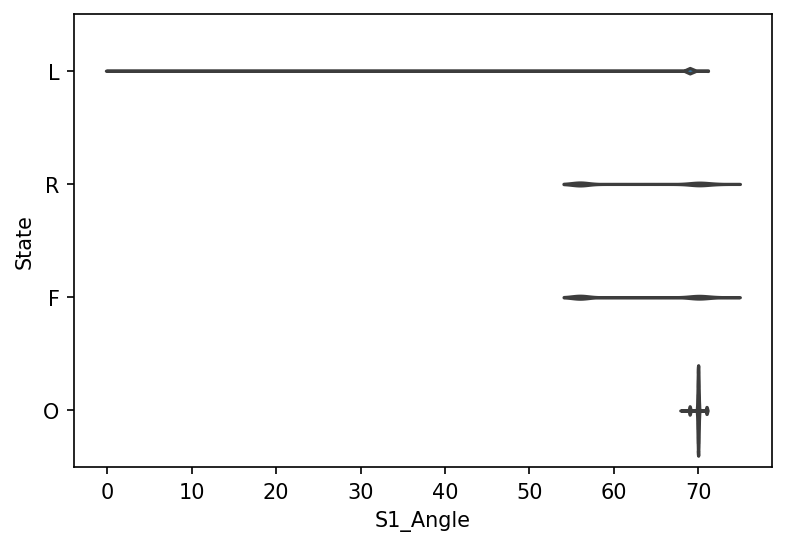

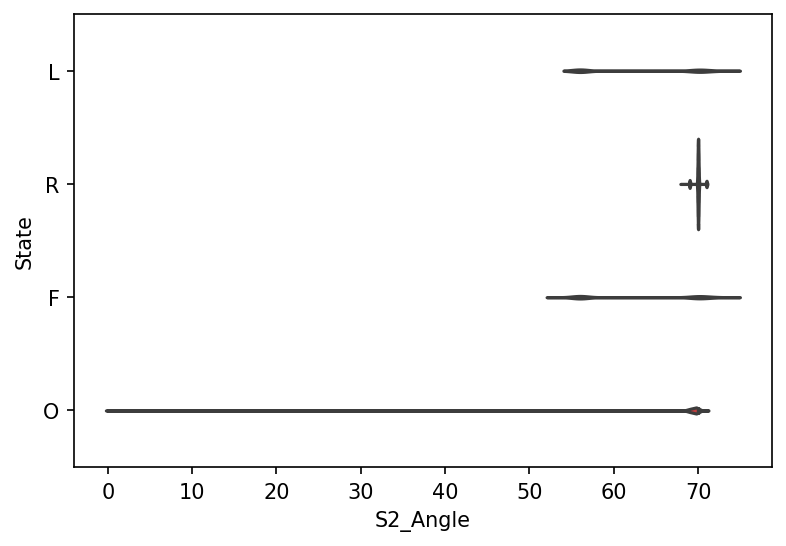

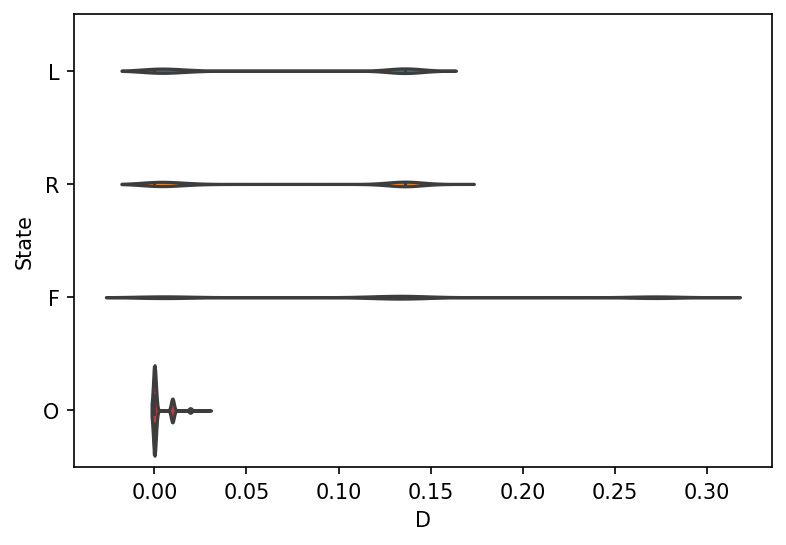

In [19]:
g = sns.violinplot(y='State', x='F1', data=df, inner='quartile')
plt.show()
g = sns.violinplot(y='State', x='F2', data=df, inner='quartile')
plt.show()
g = sns.violinplot(y='State', x='SV1', data=df, inner='quartile')
plt.show()
g = sns.violinplot(y='State', x='SV2', data=df, inner='quartile')
plt.show()
g = sns.violinplot(y='State', x='S1_Angle', data=df, inner='quartile')
plt.show()
g = sns.violinplot(y='State', x='S2_Angle', data=df, inner='quartile')
plt.show()
g = sns.violinplot(y='State', x='D', data=df, inner='quartile')
plt.show()

### Map the diagnosis column
- Where 0 is ``B`` and 1 is ``M``
- Display the value counts of each class
- Also the percentage of each class
- So that we can make sure is it a balanced or imblanaced problem


In [20]:
df['State'] = df['State'].map({'L': 1, 'R': 2, 'F': 3, 'O': 0}) #data labeling
df['State'].value_counts()

3    20114
1    19900
2    19900
0    12086
Name: State, dtype: int64

In [21]:
df['State'].value_counts(normalize=True)

3    0.279361
1    0.276389
2    0.276389
0    0.167861
Name: State, dtype: float64

### Creating out features and target
* ``X`` has all the features that we will feed into the ``ANN``
* ``y_class`` is our target column for the ``classification`` task
* ``y_reg`` is our target column for the ``regression`` task

In [22]:

y_class = df['State']
y_reg = df[['F1', 'F2']]
X = df.drop(['F1', 'F2', 'State'], axis=1)

In [23]:
y_reg.head()

,F1,F2
0,152.444444,121.955556
1,152.444444,121.955556
2,152.444444,121.955556
3,152.444444,121.955556
4,152.444444,121.955556


In [24]:
X.head()

,Time,HVDC_left,HVDC_Right,Duty_Cycle,Frequency,SV1,SV2,SR1,SR2,S1_Angle,S2_Angle,D,Total_Displacement
0,0.05,0.0,3.5,30,1,14,1,20756570.0,294336000.0,70,56,0.136111,0.136111
1,0.10,0.0,3.5,30,1,15,62,20756570.0,4541901.5,70,56,0.136111,0.272222
2,0.15,0.0,3.5,30,1,14,1,19353602.0,294336000.0,70,56,0.136111,0.408333
3,0.20,0.0,3.5,30,1,14,40,20756570.0,7077599.5,70,56,0.136111,0.544444
4,0.25,0.0,3.5,30,1,14,1,20756570.0,294336000.0,70,56,0.136111,0.680555


In [25]:
#y_class /= 4
print(y_class)


0        1
1        1
2        1
3        1
4        1
        ..
71995    0
71996    0
71997    0
71998    0
71999    0
Name: State, Length: 72000, dtype: int64


In [26]:
from keras.utils import np_utils 
no_classes = 4
#y_class = np_utils.to_categorical(y_class, no_classes)
#Y_test = np_utils.to_categorical(y_test, no_classes)

In [27]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
label_binarizer = LabelBinarizer()
y_class = label_binarizer.fit_transform(y_class)
#y_reg = scaler.fit_transform(y_reg)

#X_test = scaler.transform(X_test)

#X = StandardScaler().fit_transform(X)

In [28]:
print(X)
print(y_class)
print(y_reg)

[[-1.73202675 -0.44605032  2.04944688 ... -1.66406026  0.75579382
  -1.6310265 ]
 [-1.73197864 -0.44605032  2.04944688 ... -1.66406026  0.75579382
  -1.63093886]
 [-1.73193053 -0.44605032  2.04944688 ... -1.66406026  0.75579382
  -1.63085123]
 ...
 [ 1.73193053 -0.44605032 -0.44605032 ...  0.58474519 -0.91350259
   1.82183591]
 [ 1.73197864 -0.44605032 -0.44605032 ...  0.58474519 -0.91350259
   1.82183591]
 [ 1.73202675 -0.44605032 -0.44605032 ...  0.58474519 -0.91350259
   1.82183591]]
[[0 1 0 0]
 [0 1 0 0]
 [0 1 0 0]
 ...
 [1 0 0 0]
 [1 0 0 0]
 [1 0 0 0]]
               F1          F2
0      152.444444  121.955556
1      152.444444  121.955556
2      152.444444  121.955556
3      152.444444  121.955556
4      152.444444  121.955556
...           ...         ...
71995  152.444444  152.444444
71996  152.444444  152.444444
71997  152.444444  152.444444
71998  152.444444  152.444444
71999  152.444444  152.444444

[72000 rows x 2 columns]


In [29]:
print(y_class)

[[0 1 0 0]
 [0 1 0 0]
 [0 1 0 0]
 ...
 [1 0 0 0]
 [1 0 0 0]
 [1 0 0 0]]


### Train test split
- It will be a special type of split
- ``X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)``
- This is our typical train test split
- But in this problem we have two target columns
- One for classification one for regression
- So our ``train_test_split()`` function will take four parameters
- ``train_test_split(X, y_class, y_reg, test_size=0.2)``
- on the left side of the equal sign we have ``X_train, X_test, y_class_train, y_class_test, y_reg_train, y_reg_test``
- ``X_train, X_test, y_class_train, y_class_test, y_reg_train, y_reg_test = train_test_split(X, y_class, y_reg, test_size=0.2)``

In [30]:
X_train, X_test, y_class_train, y_class_test, y_reg_train, y_reg_test = train_test_split(X, y_class, y_reg, test_size=0.2, random_state=2000, shuffle = True)

In [31]:
print(y_class_test)

[[0 0 1 0]
 [0 0 1 0]
 [0 1 0 0]
 ...
 [1 0 0 0]
 [0 1 0 0]
 [0 1 0 0]]


## Scaling the features

<p style="text-align: justify">Scaling the input data for artificial neural networks (ANNs) is generally considered necessary, especially when the input features have different ranges of values. This is because ANNs are sensitive to the scale of the input data, and can produce unexpected results if the input features have different ranges.</p>

In [32]:
# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)

# #X = StandardScaler().fit_transform(X)
# y = LabelBinarizer().fit_transform(y)

In [33]:
# from keras.utils import np_utils 
# no_classes = 4
# y_class = np_utils.to_categorical(y_class, no_classes)
# #Y_test = np_utils.to_categorical(y_test, no_classes)

In [34]:
print(y_reg_test)

               F1          F2
42255  121.955556  152.444444
15592  152.444444  152.444444
61829  152.444444  152.444444
39071  150.266667  154.622222
23087  152.444444  154.622222
...           ...         ...
39052  150.266667  152.444444
8434   121.955556  121.955556
59346  152.444444  152.444444
50963  154.622222  121.955556
36394  152.444444  150.266667

[14400 rows x 2 columns]


In [35]:
import math
input_shape = X.shape[1]
print(input_shape)
# input_shape = pow(2, math.ceil(math.log(input_shape)/math.log(2)))
# print(input_shape)

13


In [36]:
# n_samples, input_shape = X_train.shape
# X_train = X_train.reshape(n_samples, time_steps, input_shape)

## Build the model using Keras funcation API

This is an implementation of a neural network architecture that can perform both classification and regression tasks. The architecture consists of several layers of dense (fully connected) layers, which are used to extract features from the input data and make predictions.

Here's a breakdown of the code:

1. input_shape: This line defines the shape of the input data. The X.shape[1] expression retrieves the number of features in the input data, which is used to define the shape of the first layer of the model.

2. inputs: This line creates an input layer for the model, which will accept data in the form of a tensor with the specified shape. The Input function is from the Keras library and is used to create input layers for neural network models.

3. hidden: This section defines four dense (fully connected) layers, which are used to extract features from the input data. Each layer takes the output of the previous layer as input, and applies a non-linear activation function (ReLU in this case) to the output. The name argument is used to give each layer a unique name.

4. output_class: This layer is a dense layer with a sigmoid activation function, which is used to predict the binary class label (0 or 1) for the input data. The binary_crossentropy loss function is used to train this layer.

5. output_reg: This layer is a dense layer without an activation function, which is used to predict a continuous numerical value for the input data. The mean_squared_error loss function is used to train this layer.

6. model: This line creates a Model object that combines the input and output layers into a complete model. The inputs argument specifies the input layer and the outputs argument specifies the two output layers (for classification and regression).

7. model.compile: This line compiles the model by specifying the optimizer (Adam), loss functions (binary_crossentropy and mean_squared_error), and metrics (accuracy) used for training.

The architecture of this model is designed to handle both binary classification and regression tasks. The model is trained using two separate loss functions, one for each task, so that it can learn to make predictions for both tasks simultaneously.

In [37]:
# from keras.layers import LSTM, GRU, Concatenate

# # Assuming you have a time series with a fixed sequence length (time_steps)
# time_steps = 10
# #X = X.reshape(X.shape[0], time_steps, X.shape[1])

# inputs = Input(shape=(time_steps, input_shape,), name="input")  # Assuming a 3D input shape with a sequence dimension

# # LSTM layer for time series information in classification part
# hidden = LSTM(128, activation='relu', name="hidden1")(inputs)
# hidden = LSTM(128, activation='relu', name="hidden2")(hidden)
# output_class = Dense(4, activation='softmax', kernel_regularizer=l2(1), name="output_classification")(hidden)

# # LSTM layer for time series information in regression part
# # hidden_regression = LSTM(128, activation='relu', name="lstm_regression")(inputs)
# # hidden_regression = Dense(128, activation='relu', name="hidden_regression")(hidden_regression)
# output_reg = Dense(2, name="output_regression")(hidden)

# # Concatenate the classification output with the regression output
# #final_output = Concatenate()([output_class, output_reg])

# model = Model(inputs=inputs, outputs=[output_class, output_reg])
# optimize = Adam(learning_rate=3e-5)
# model.compile(optimizer=optimize, 
#               loss=['categorical_crossentropy', 'mean_squared_error'],
#               loss_weights=[1.0, 0.5])  # You can adjust the loss weights as needed.


In [38]:
# inputs = Input(shape=(input_shape,), name="input")
# hidden = Dense(512, activation='relu', name="hidden1")(inputs)
# #hidden = Dropout(0.3)(hidden)
# hidden = Dense(512, activation='relu' ,name="hidden2")(hidden)
# #hidden = Dropout(0.2)(hidden)
# #hidden = Dense(512, activation='relu' ,name="hidden3")(hidden)
# #hidden = Dropout(0.2)(hidden)
# hidden = Dense(128, activation='relu' ,name="hidden3")(hidden)
# #hidden = Dropout(0.2)(hidden)
# output_class = Dense(4, activation='softmax', kernel_regularizer=l2(1), name="output_classification")(hidden)
# output_reg = Dense(2, kernel_regularizer=l2(0.5), name="output_regression")(hidden)
# model = Model(inputs=inputs, outputs=[output_class, output_reg])
# optimize = Adam(learning_rate=3e-5)
# model.compile(optimizer=optimize, 
#               loss=['categorical_crossentropy', 'mean_squared_error'], 
#               metrics=['accuracy'])

inputs = Input(shape=(input_shape,), name="input")
hidden = Dense(512, activation='relu', name="hidden1")(inputs)
#hidden = Dropout(0.3)(hidden)
hidden = Dense(128, activation='relu' ,name="hidden2")(hidden)
#hidden = Dropout(0.2)(hidden)
hidden = Dense(64, activation='relu' ,name="hidden3")(hidden)
#hidden = Dropout(0.2)(hidden)
#hidden = Dense(64, activation='relu' ,name="hidden3")(hidden)
#hidden = Dropout(0.2)(hidden)

# Bypass layer for classification
hidden_classification = Dense(512, activation='relu', name="hidden_classification1")(hidden)
hidden_classification = Dense(128, activation='relu', name="hidden_classification2")(hidden_classification)

# Bypass layer for regression
#hidden_regression = Dense(64, activation='relu', name="hidden_regression1")(hidden)
#hidden_regression = Dense(128, activation=LeakyReLU(alpha=0.1), name="hidden_regression2")(hidden)


#output_class = Dense(4, activation='softmax', kernel_regularizer=l2(1), name="output_classification")(hidden_classification)
output_class = Dense(4, activation='softmax', kernel_regularizer=l2(1), name="output_classification")(hidden_classification)
# output_reg = Dense(2,name="output_regression")(hidden)
output_reg = Dense(2, kernel_regularizer=l2(1), name="output_regression")(hidden)
model = Model(inputs=inputs, outputs=[output_class, output_reg])
optimize = Adam(learning_rate=3e-5)
model.compile(optimizer=optimize, loss=['categorical_crossentropy', 'mean_squared_error'], metrics=['accuracy'], loss_weights=[0.5, 0.5])

In [39]:
from IPython.display import display, HTML

# Change the font size for the entire cell output
display(HTML("<style>.output { font-size: 20px; }</style>"))
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 13)]         0                                            
__________________________________________________________________________________________________
hidden1 (Dense)                 (None, 512)          7168        input[0][0]                      
__________________________________________________________________________________________________
hidden2 (Dense)                 (None, 128)          65664       hidden1[0][0]                    
__________________________________________________________________________________________________
hidden3 (Dense)                 (None, 64)           8256        hidden2[0][0]                    
______________________________________________________________________________________________

## Model plot
This figure clearly depits that we have two different output for this mode. One is for classification one is for regression.
1. 1 Input layer
2. 4 Hidden layers
3. 1 output layer seperated for two task
    - 1 is for classification
    - 1 is for regression

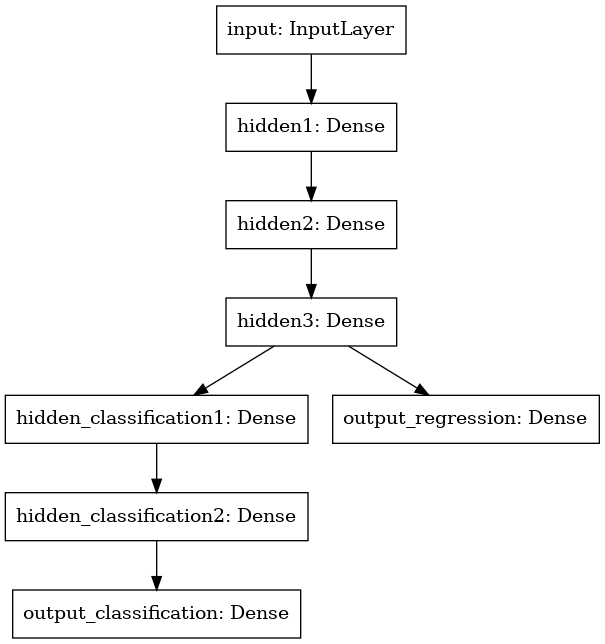

In [136]:
# to save it use this parameter to_file="model_name.png",
from tensorflow.keras.utils import plot_model
plot_model(
    model,
    to_file="model_name.png",  # Specify the filename to save the plot
    show_shapes=True,         # Display shapes of layers
    expand_nested=True,       # Expand nested models (e.g., submodels within the main model)
    dpi=1000,                   # Adjust DPI for better image quality
)

plot_model(model)

In [41]:
early_stop = EarlyStopping(monitor='val_loss', patience=6, mode='min')
log_csv = CSVLogger("train_val_logs.csv", separator=',', append=False)
callbacks=[log_csv]

In [42]:
print(y_reg_test)

               F1          F2
42255  121.955556  152.444444
15592  152.444444  152.444444
61829  152.444444  152.444444
39071  150.266667  154.622222
23087  152.444444  154.622222
...           ...         ...
39052  150.266667  152.444444
8434   121.955556  121.955556
59346  152.444444  152.444444
50963  154.622222  121.955556
36394  152.444444  150.266667

[14400 rows x 2 columns]


<p>By setting verbose 0, 1 we just say how do you want to 'see' the training progress for each epoch.

- ``verbose=0`` will show you nothing (silent)

- ``verbose=1`` will show you an animated progress bar like this:</p>

In [43]:
history = model.fit(X_train, [y_class_train, y_reg_train],
                    batch_size=128, epochs=400,verbose=1, 
                    validation_data=(X_test,
                                     [y_class_test,
                                      y_reg_test]))

Epoch 1/400
450/450 [==============================] - 5s 9ms/step - loss: 10088.8135 - output_classification_loss: 1.2836 - output_regression_loss: 20156.9648 - output_classification_accuracy: 0.3657 - output_regression_accuracy: 0.6923 - val_loss: 9158.9648 - val_output_classification_loss: 1.2151 - val_output_regression_loss: 18298.3516 - val_output_classification_accuracy: 0.5357 - val_output_regression_accuracy: 0.6982
Epoch 2/400
450/450 [==============================] - 3s 7ms/step - loss: 6786.5327 - output_classification_loss: 1.2033 - output_regression_loss: 13554.2803 - output_classification_accuracy: 0.4814 - output_regression_accuracy: 0.6923 - val_loss: 3847.6204 - val_output_classification_loss: 1.1810 - val_output_regression_loss: 7677.2305 - val_output_classification_accuracy: 0.5107 - val_output_regression_accuracy: 0.6982
Epoch 3/400
450/450 [==============================] - 4s 9ms/step - loss: 1824.3010 - output_classification_loss: 1.1805 - output_regression_loss

## Prediction for classification and regression

In [44]:
y_class_pred, y_reg_pred = model.predict(X_test)
y_class_pred = np.round(y_class_pred)

In [45]:
print(y_class_pred, y_class_test)

[[0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 ...
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]] [[0 0 1 0]
 [0 0 1 0]
 [0 1 0 0]
 ...
 [1 0 0 0]
 [0 1 0 0]
 [0 1 0 0]]


In [46]:
print(y_reg_pred, y_reg_test)

[[122.13213  152.4004  ]
 [152.63672  152.42554 ]
 [152.69215  152.61638 ]
 ...
 [152.49939  152.41093 ]
 [154.6125   122.132576]
 [152.44206  150.22368 ]]                F1          F2
42255  121.955556  152.444444
15592  152.444444  152.444444
61829  152.444444  152.444444
39071  150.266667  154.622222
23087  152.444444  154.622222
...           ...         ...
39052  150.266667  152.444444
8434   121.955556  121.955556
59346  152.444444  152.444444
50963  154.622222  121.955556
36394  152.444444  150.266667

[14400 rows x 2 columns]


## Performance evaluation for classification

In [47]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from IPython.display import HTML

print(classification_report(y_class_test,y_class_pred))


              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2356
           1       1.00      1.00      1.00      4029
           2       0.99      0.99      0.99      3959
           3       1.00      0.98      0.99      4056

   micro avg       0.99      0.99      0.99     14400
   macro avg       0.99      0.99      0.99     14400
weighted avg       0.99      0.99      0.99     14400
 samples avg       0.99      0.99      0.99     14400



In [48]:
print(accuracy_score(y_class_test,y_class_pred))
# check the accuracy
score = model.evaluate(X_train, [y_class_train, y_reg_train])

print('Classification Test accuracy:', score[3])
print('Regression Test accuracy:', score[4])

0.9925694444444444
1800/1800 [==============================] - 7s 4ms/step - loss: 0.0899 - output_classification_loss: 0.0251 - output_regression_loss: 0.0442 - output_classification_accuracy: 0.9931 - output_regression_accuracy: 0.9880
Classification Test accuracy: 0.9931250214576721
Regression Test accuracy: 0.9880034923553467


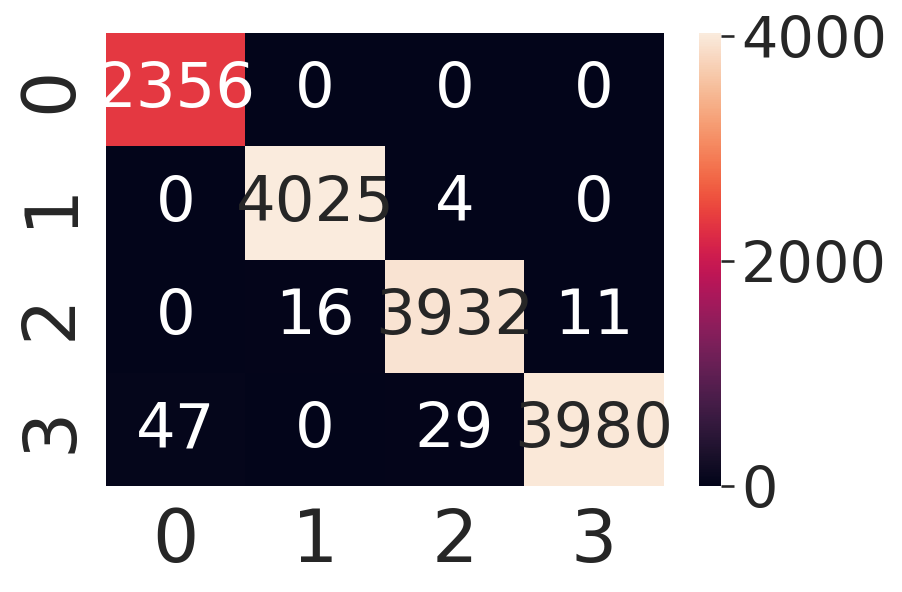

In [82]:
label_binarizer.fit([0,1,2,3])
y_class_test1 = label_binarizer.inverse_transform(y_class_test)
y_class_pred1 = label_binarizer.inverse_transform(y_class_pred)
#print(y_class_test1)
cn_mt = confusion_matrix(y_class_test1,y_class_pred1)
sns.set(font_scale=2.5)
sns.heatmap(cn_mt, annot=True, fmt='g')
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.show()

## Perfromance evaluation for regression

In [50]:
from sklearn.metrics import r2_score, mean_squared_error
print(mean_squared_error(y_reg_test,y_reg_pred,squared = False))

0.15819080688771786


In [51]:
print("R2 score: ",r2_score(y_reg_test,y_reg_pred))

R2 score:  0.999862089786635


In [52]:
history.history.keys()

dict_keys(['loss', 'output_classification_loss', 'output_regression_loss', 'output_classification_accuracy', 'output_regression_accuracy', 'val_loss', 'val_output_classification_loss', 'val_output_regression_loss', 'val_output_classification_accuracy', 'val_output_regression_accuracy'])

## Learning Curve for classification

In [53]:
import matplotlib.pyplot as plt
import numpy as np

def plot_res(df1, df2, df3, df4, S):
    fig, ax = plt.subplots()
    fig.subplots_adjust(right=0.75)

    twin1 = ax.twinx()
    #twin2 = ax.twinx()
    #twin3 = ax.twinx()

    #twin2.spines.right.set_position(("axes", 1.2))

    p1, = ax.plot(df1, "r-", label="Left sensor value")
    p2, = ax.plot(df2, "r:", label="Right sensor value")
    p3, = twin1.plot(df3, "b-", label="Left sensor value")
    p4, = twin1.plot(df4, "b:", label="Right sensor value")

    ax.set_xlabel("Epoch", fontsize=25)
    ax.set_ylabel("Accuracy", fontsize=25)
    twin1.set_ylabel("Loss", fontsize=25)
    

    # Set the left and right y-axes to share the same tick marks
    ax.yaxis.label.set_color(p1.get_color())
    #twin1.yaxis.label.set_color(p2.get_color())

    # Set the left and right y-axes to share the same tick marks
    twin1.yaxis.label.set_color(p3.get_color())
    #twin2.yaxis.label.set_color(p4.get_color())

    tkw = dict(size=4, width=1.5)
    ax.tick_params(axis='x', **tkw)

    # Set the tick size for the left and right y-axes
    ax.tick_params(axis='y', colors=p1.get_color(),  **tkw)
    twin1.tick_params(axis='y', colors=p3.get_color(), labelright='off')
    #twin2.tick_params(axis='y', colors=p3.get_color())

    ax.set_title(S, fontsize=25)
    plt.savefig("right.png")
    plt.show()

# Example usage:
# plot_res(df1, df2, df3, df4, "Your Title")

# import matplotlib.pyplot as plt
# import numpy as np

# def plot_res(df1,df2, df3, df4, S):
#     fig, ax = plt.subplots()
#     fig.subplots_adjust(right=0.75)

#     twin1 = ax.twinx()
#     twin2 = ax.twinx()
#     twin3 = ax.twinx()

#     twin2.spines.right.set_position(("axes", 1.2))

#     p1, = ax.plot(df1, "r--", label="Left sensor value")
#     p2, = twin1.plot(df2, "r-", label="Right sensor value")
#     p3, = twin2.plot(df3, "b--", label="Left sensor value")
#     p4, = twin3.plot(df4, "b-", label="Right sensor value")
#     #p5, = twin4.plot(df['Time'], df['F2'], "g--", label="Left sensor value")
#     #p6, = twin5.plot(df['Time'], df['F2'], "g--", label="Right sensor value")

# #     ax.set_xlim(0, 20)
# #     ax.set_ylim(0, 90)
# #     twin2.set_ylim(50, 90)
# #     twin4.set_ylim(110, 160)

#     ax.set_xlabel("Epoch", fontsize=25)
#     ax.set_ylabel("Accuracy", fontsize=25)
#     twin3.set_ylabel("Loss", fontsize=25)
#     #twin3.set_ylabel("DEA Angle ($^\circ$)", fontsize=25)
#     #twin4.set_ylabel("DEA Force (mN)", fontsize=24)

#     ax.yaxis.label.set_color(p1.get_color())
#     #twin1.yaxis.label.set_color(p2.get_color())
#     #twin2.yaxis.label.set_color(p3.get_color())
#     twin3.yaxis.label.set_color(p4.get_color())

#     tkw = dict(size=4, width=1.5)
#     ax.tick_params(axis='x', **tkw)
#     ax.tick_params(axis='y', colors=p1.get_color(), **tkw)
#     twin1.tick_params(axis='y', labelright = 'off')
#     twin2.tick_params(axis='y', labelright = 'off')
#     twin3.tick_params(axis='y', labelright = 'off')
#     # Set tick size for twin2
#     #twin4.tick_params(axis='y', colors=p5.get_color(), width=1.5)  # Set tick size for twin4

#     #twin2.spines['right'].set_position(('outward', 0))
#     #twin4.spines['right'].set_position(('outward', 63))

# #     ax.set_yticks(np.arange(0, 91, 30))
# #     ax.set_xticks(np.arange(0, 21, 10))
# #     twin2.set_yticks(np.arange(50, 91, 20))
# #     #twin4.set_yticks(np.arange(110, 161, 25))

# #     for tick3 in ax.get_xticklabels():
# #         tick3.set_fontsize(20)
# #     for tick4 in ax.get_yticklabels():
# #         tick4.set_fontsize(20)
# #     for tick1 in twin3.get_yticklabels():
# #         tick1.set_fontsize(20)
# #     for tick2 in twin4.get_yticklabels():
# #         tick2.set_fontsize(20)

#     ax.set_title(S, fontsize=25)
#     plt.savefig("right.png")
#     plt.show()

# # Example usage:
# # plot_left_yy(your_dataframe, "Your Title")


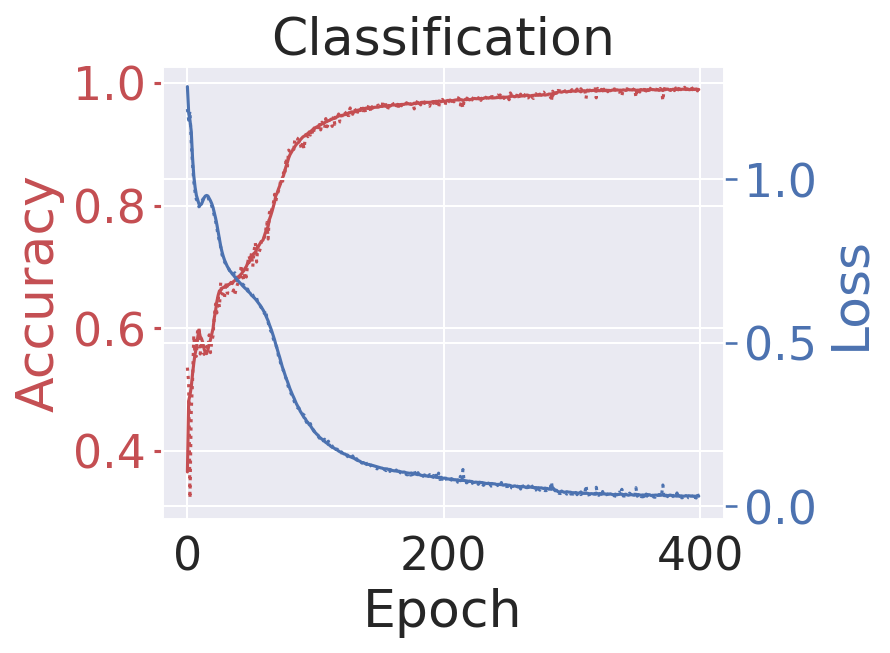

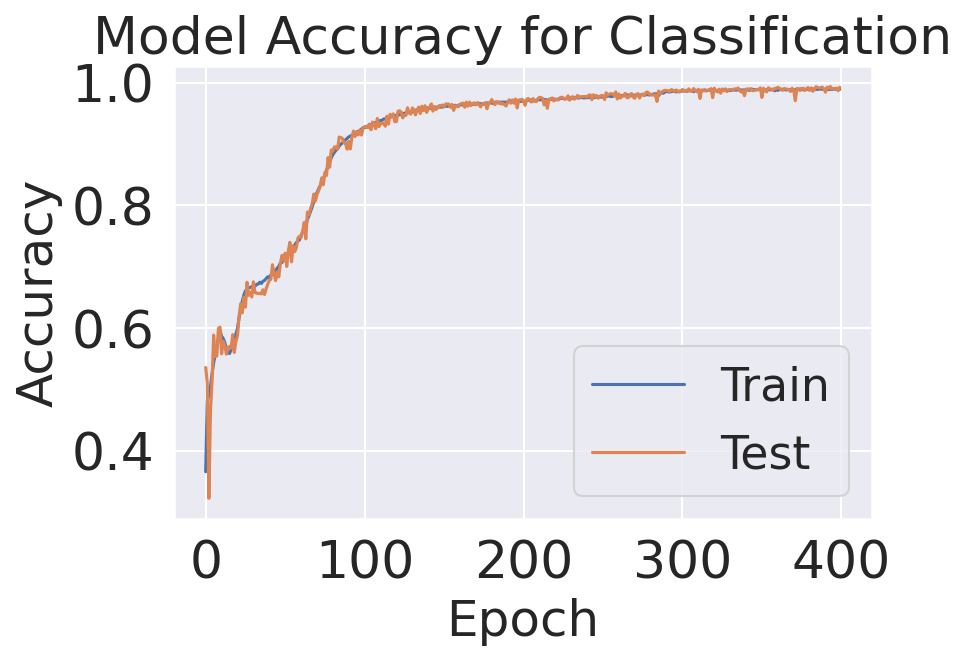

In [54]:
plot_res(history.history['output_classification_accuracy'],history.history['val_output_classification_accuracy'], history.history['output_classification_loss'], history.history['val_output_classification_loss'], "Classification")
## Learning Curve for classification
plt.plot(history.history['output_classification_accuracy'])
plt.plot(history.history['val_output_classification_accuracy'])
plt.title('Model Accuracy for Classification', fontsize=25)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='lower right')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
#plt.grid(False)
#plt.axis('off')

plt.show()

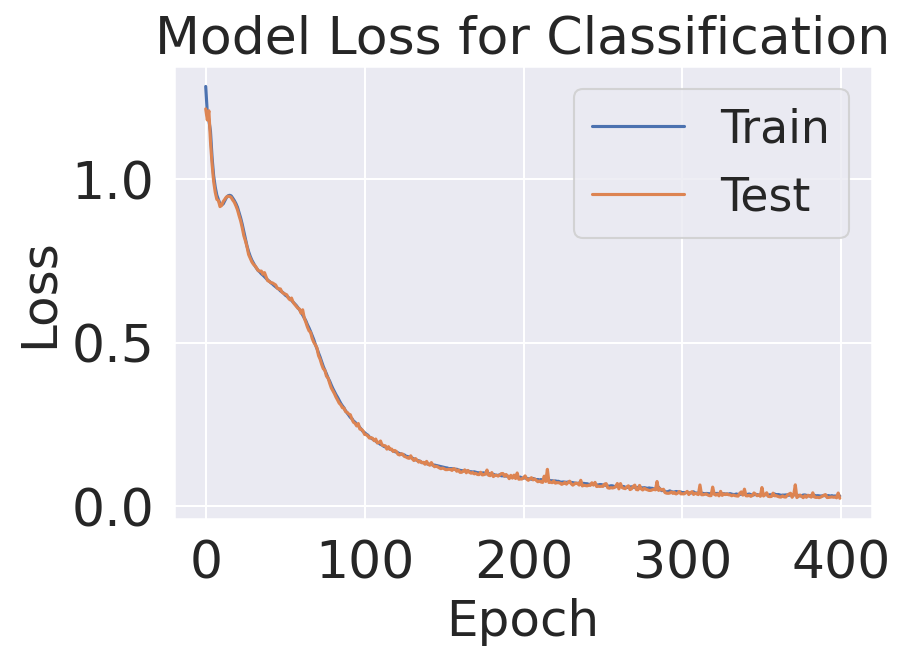

In [55]:
## Learning Curve for classification
plt.plot(history.history['output_classification_loss'])
plt.plot(history.history['val_output_classification_loss'])
plt.title('Model Loss for Classification', fontsize=25)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
#plt.grid(False)
#plt.axis('off')
plt.legend(['Train', 'Test'], loc='upper right')
plt.show()

## Learning Curve for Regression

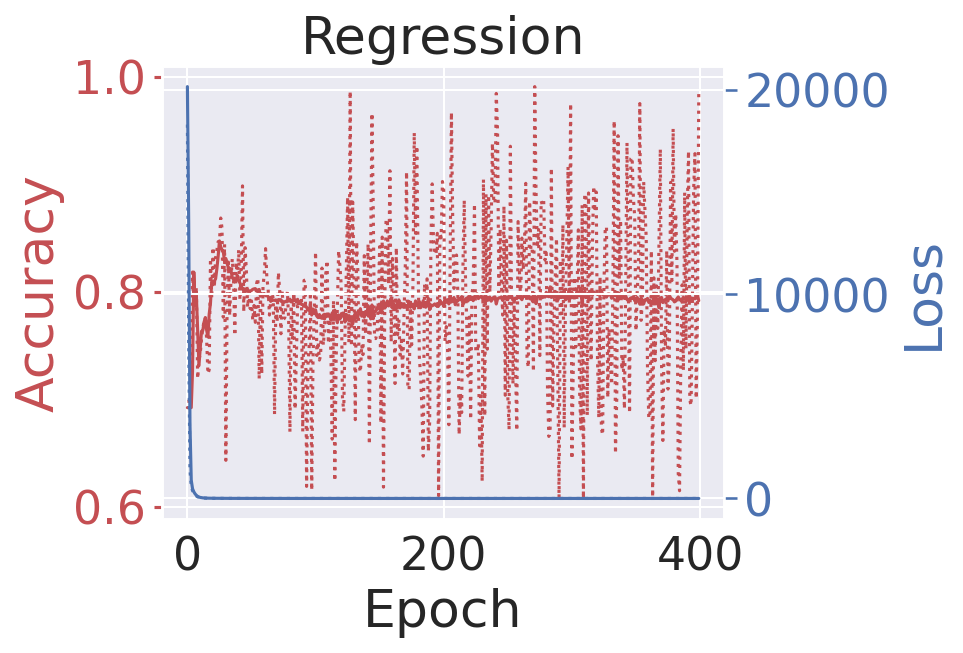

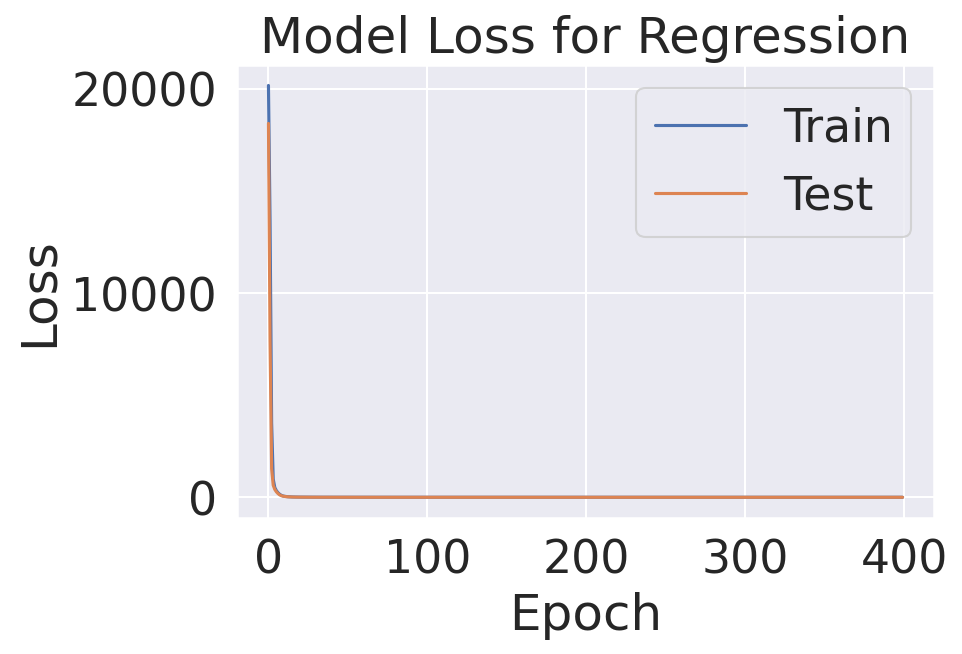

In [56]:
## Learning Curve for classification

plot_res(history.history['output_regression_accuracy'],history.history['val_output_regression_accuracy'], history.history['output_regression_loss'], history.history['val_output_regression_loss'], "Regression")

plt.plot(history.history['output_regression_loss'])
plt.plot(history.history['val_output_regression_loss'])
plt.title('Model Loss for Regression')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper right')
plt.show()

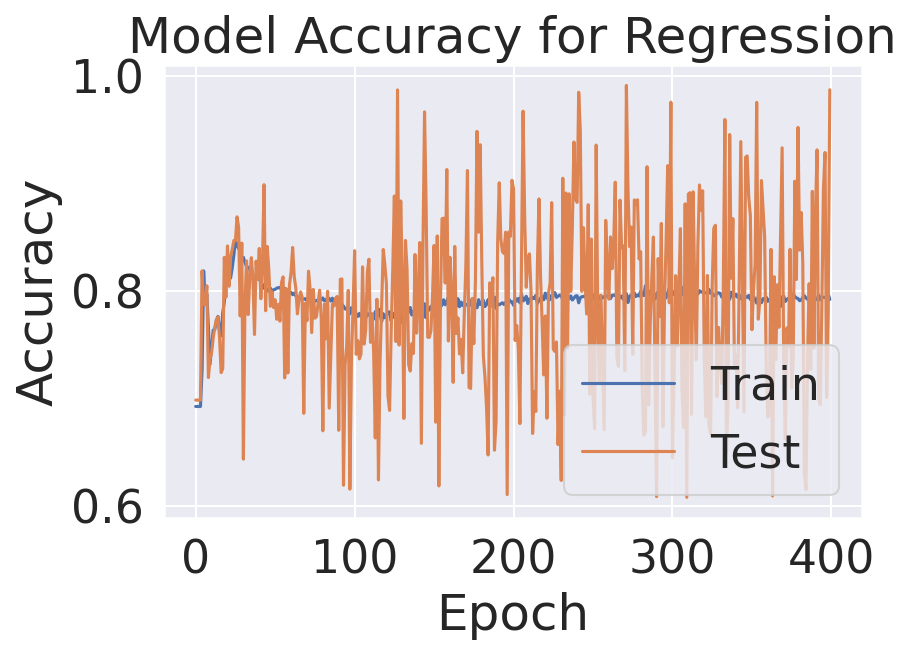

In [57]:
## Learning Curve for classification
plt.plot(history.history['output_regression_accuracy'])
plt.plot(history.history['val_output_regression_accuracy'])
plt.title('Model Accuracy for Regression')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()

In [58]:
import math
def convert_test(df, S):
    df1 = df;
    #print(df1.shape)
    df['State'] = df['State'].map({'L': 1, 'R': 2, 'F': 3, 'O': 0}) #data labeling
    df['State'].value_counts()
    df['State'].value_counts(normalize=True)
    y_class = df['State']
    y_reg = df[['F1', 'F2']]
    X = df.drop(['F1', 'F2', 'State'], axis=1)
    
    scaler = StandardScaler()
    X1 = scaler.fit_transform(X)
    #label_binarizer = LabelBinarizer()
    #y_class = label_binarizer.fit_transform(y_class)
    
#     print(X1)
#     print(y_class)
#     print(y_reg)
    
    y_class_pred, y_reg_pred = model.predict(X1)
    y_reg_pred = pd.DataFrame(y_reg_pred, columns = ['F1','F2'])
    y_class_pred = np.round(y_class_pred)
    y_class_pred = label_binarizer.inverse_transform(y_class_pred)
    #y_class = label_binarizer.inverse_transform(y_class)
    
    #print(y_class, y_class_pred)
    predicted_D = calculate_distance(y_reg_pred['F1'], y_reg_pred['F2'])
    real_D = calculate_distance(df1['F1'], df1['F2'])
    #print(predicted_D, real_D)
    
    plot_D(predicted_D, real_D, S)
    
        
    conf_D(y_class, y_class_pred)
    
    
    x1 = 0
    y1 = 0
    x2 = 0
    y2 = 0
    xx_predicted = []
    yy_predicted = []
    xx_real = []
    yy_real = []
    for x in range(y_class.size):
        if(y_class[x] == 1):
            x1-=predicted_D[x]/math.sqrt(2)
            y1+=predicted_D[x]/math.sqrt(2)
            x2-=real_D[x]/math.sqrt(2)
            y2+=real_D[x]/math.sqrt(2)
        elif (y_class[x] == 2):
            x1+=predicted_D[x]/math.sqrt(2)
            y1+=predicted_D[x]/math.sqrt(2)
            x2+=real_D[x]/math.sqrt(2)
            y2+=real_D[x]/math.sqrt(2)
        elif (y_class[x] == 3):
            x1+=0
            y1+=predicted_D[x];
            x2+=0
            y2+=real_D[x]
        else:
            x1+=0
            y1+=predicted_D[x]/(2.0)
            x2+=0
            y2+=real_D[x]/(2.0)
        xx_predicted.append(x1)
        yy_predicted.append(y1)
        xx_real.append(x2)
        yy_real.append(y2)
        time = df['Time'].tolist()
        #time = [0 + i * 0.002 for i in range(int((20 - 0) / 0.002))]

#     X_Y_Spline = make_interp_spline(x, y)
#     X_ = np.linspace(x.min(), x.max(), 500)
#     Y_ = X_Y_Spline(X_)    
    # Define the parameters for the Gaussian function
#     xx_predicted = apply_gauss(xx_predicted)
#     xx_real = apply_gauss(xx_real)
#     yy_predicted = apply_gauss(yy_predicted)
#     yy_real = apply_gauss(yy_real)

    #xx_predicted, yy_predicted = smooth(xx_predicted, yy_predicted)
    #xx_real, yy_real = smooth(xx_real, yy_real)
    
    print(len(time), len(xx_predicted), len(xx_real))
    
    # 	Time	HVDC_left	HVDC_Right	Duty_Cycle	Frequency	SV1	SV2	SR1	SR2	S1_Angle	S2_Angle	D	Total_Displacement
    
    #print(len(time), len(xx_predicted), len(yy_predicted), len(xx_real), len(yy_real))
    dict = {'Time': time, 'HVDC_left': df1['HVDC_left'], 'HVDC_Right': df1['HVDC_Right'], 'Duty_Cycle': df1['Duty_Cycle'], 'Frequency': df1['Frequency'],
            'SV1': df1['SV1'],'SV2': df1['SV2'],'SR1': df1['SR1'],'SR2': df1['SR2'],'S1_Angle': df1['S1_Angle'],'S2_Angle': df1['S2_Angle'],'F1': df1['F1'],'F2': df1['F2'],'real_D': real_D, 'predicted_D': predicted_D,'D': df1['D'],'State': df1['State'], 'Predicted_displacement_x': xx_predicted, 'Predicted_displacement_y': yy_predicted, 'Real_displacement_x': xx_real, 'Real_displacement_y': yy_real}
    df = pd.DataFrame(dict)
    df.to_csv(S+'.csv')
    #return X, y_class, y_reg

In [59]:
from scipy import interpolate
from scipy.interpolate import make_interp_spline
def smooth (x, y):

    x = np.array(x)
    y=np.sort(np.array(y))
    #x = np.sort(np.array([x]))
    print(len(x), len(y))
    X_Y_Spline = make_interp_spline(y, x)
    Y_ = np.linspace(y.min(), y.max(), len(y))
    X_ = X_Y_Spline(Y_)
    return X_, Y_

In [60]:
import numpy as np
def apply_gauss(data):
    # Define the parameters for the Gaussian function
    a = 35
    b = -10
    c = 1
    xmin = -10
    xmax = 2
    ymin = -5
    ymax = 35
    y =[]
    # Create the Gaussian filter
    for i in range(len(data)): 
        y.append(gaussian(data[i], a, b, c))

    # Apply the filter to the data
    return y
def gaussian(x, a, b, c):
    return (float(a * np.exp(-1*(x - b)**2 / (2 * c**2))))

In [61]:
def calculate_distance(F1, F2):
    distance = abs(F1-152.4444 + F2-152.4444)*100*0.05*0.05/56.0
    #distance = abs(F1 + F2)*100*0.05*0.05/56.0
    return distance
    

In [62]:
#X, y_class, y_reg = convert_test(df1)

In [63]:
print(X)
print(y_class)
print(y_reg)

[[-1.73202675 -0.44605032  2.04944688 ... -1.66406026  0.75579382
  -1.6310265 ]
 [-1.73197864 -0.44605032  2.04944688 ... -1.66406026  0.75579382
  -1.63093886]
 [-1.73193053 -0.44605032  2.04944688 ... -1.66406026  0.75579382
  -1.63085123]
 ...
 [ 1.73193053 -0.44605032 -0.44605032 ...  0.58474519 -0.91350259
   1.82183591]
 [ 1.73197864 -0.44605032 -0.44605032 ...  0.58474519 -0.91350259
   1.82183591]
 [ 1.73202675 -0.44605032 -0.44605032 ...  0.58474519 -0.91350259
   1.82183591]]
[[0 1 0 0]
 [0 1 0 0]
 [0 1 0 0]
 ...
 [1 0 0 0]
 [1 0 0 0]
 [1 0 0 0]]
               F1          F2
0      152.444444  121.955556
1      152.444444  121.955556
2      152.444444  121.955556
3      152.444444  121.955556
4      152.444444  121.955556
...           ...         ...
71995  152.444444  152.444444
71996  152.444444  152.444444
71997  152.444444  152.444444
71998  152.444444  152.444444
71999  152.444444  152.444444

[72000 rows x 2 columns]


In [64]:
#print(predicted_D, real_D)

In [65]:
def plot_D(predicted_D, real_D, S):
    plt.plot(df1['Time'], predicted_D)
    plt.plot(df1['Time'],real_D)
    plt.title(S)
    plt.xlabel('Time (s)')
    plt.ylabel('Displacement (cm)')
    plt.legend(['Predicted', 'Real'], loc='upper left')
    plt.show()

In [66]:
def conf_D(y_class, y_class_pred):
    cn_mt = confusion_matrix(y_class, y_class_pred)
    sns.heatmap(cn_mt, annot=True, fmt='g')
    plt.show()

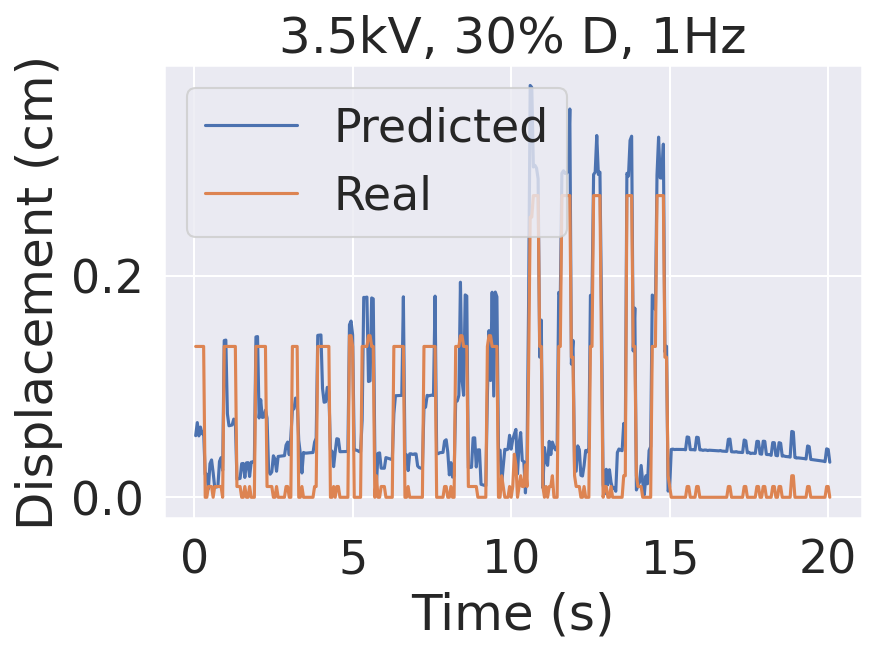

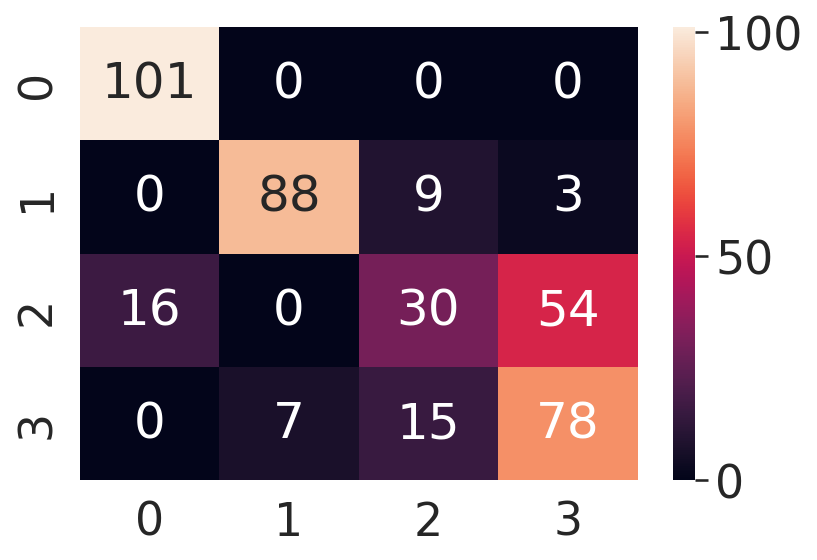

401 401 401


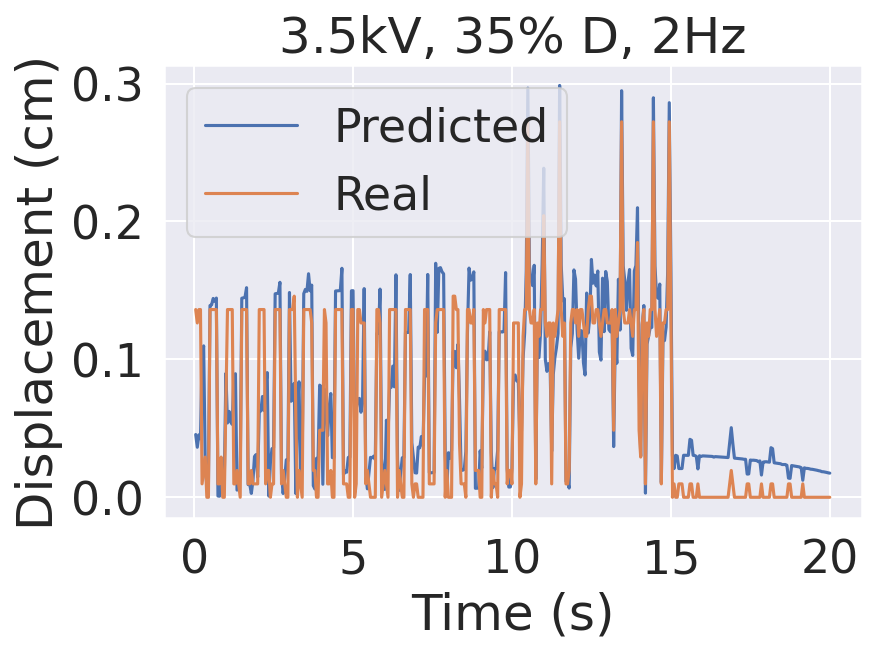

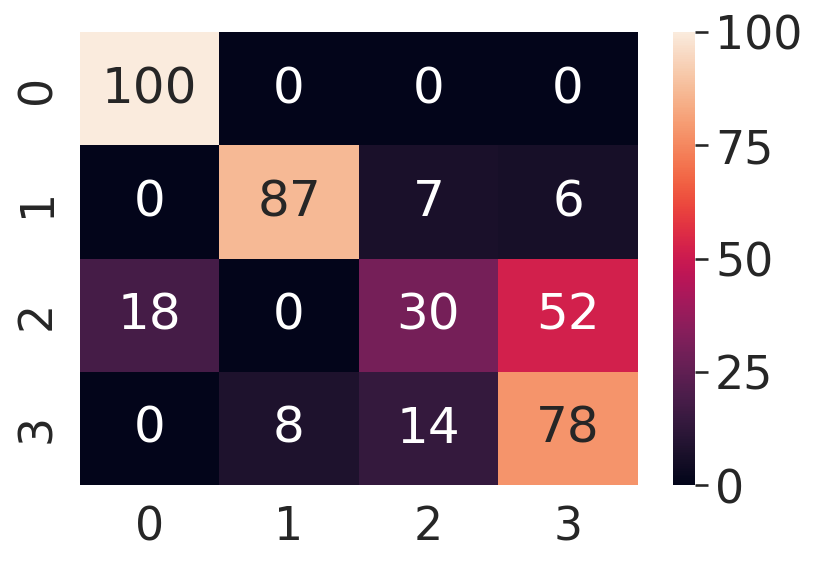

400 400 400


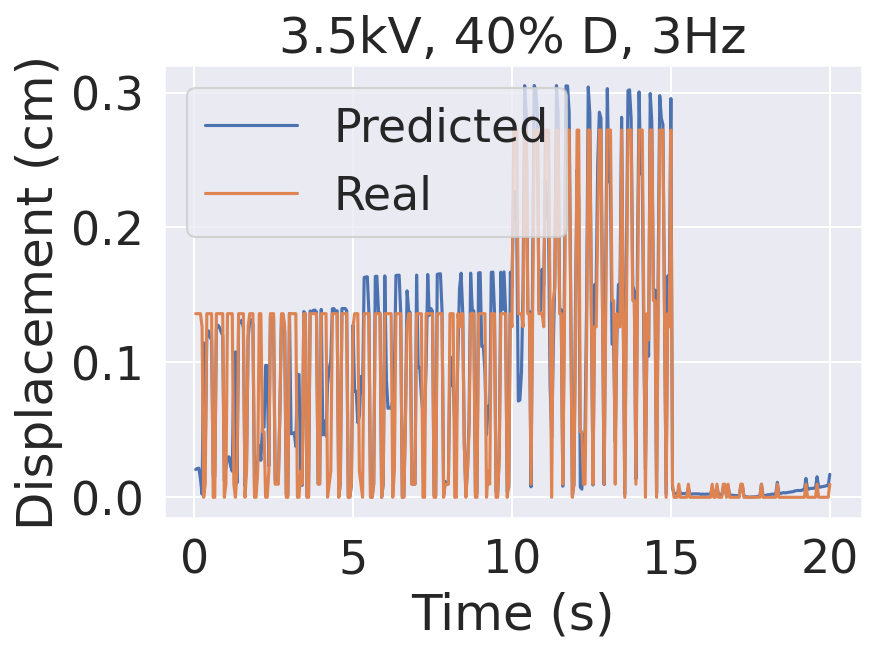

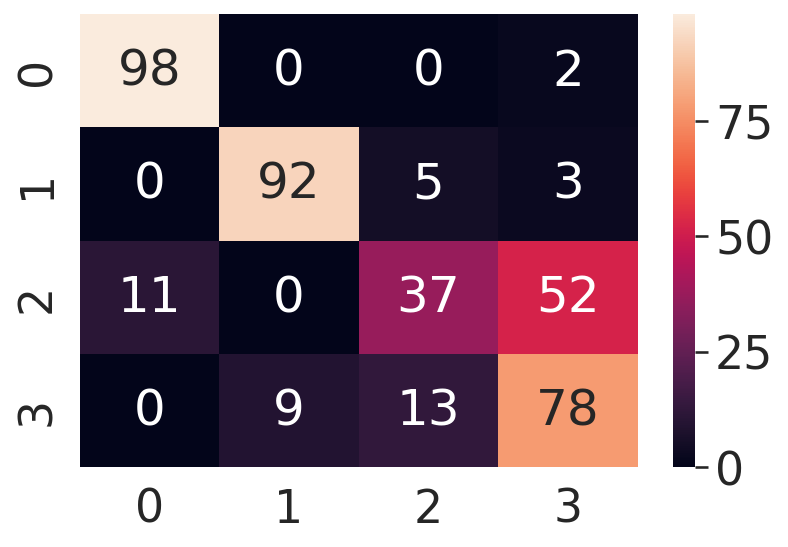

400 400 400


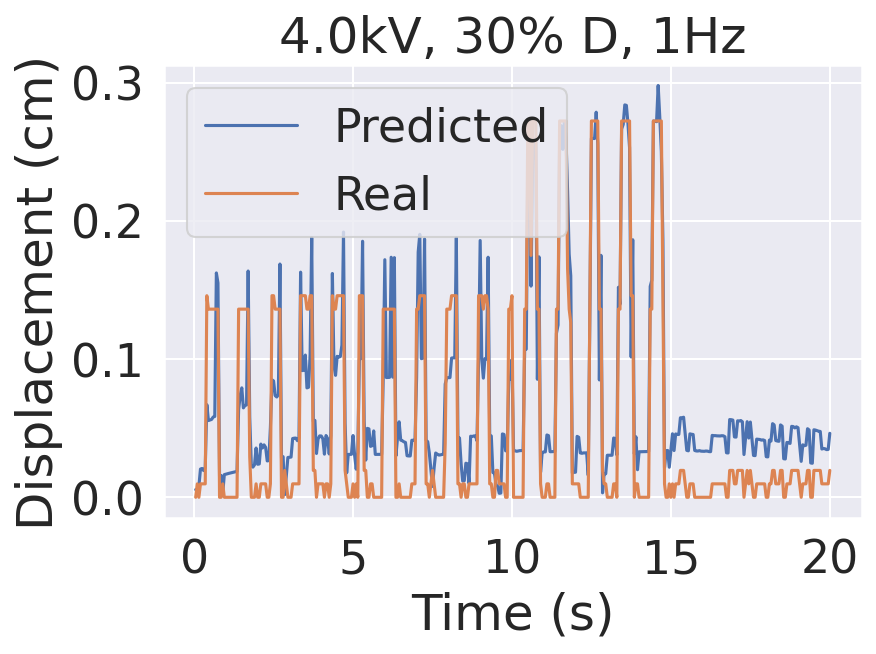

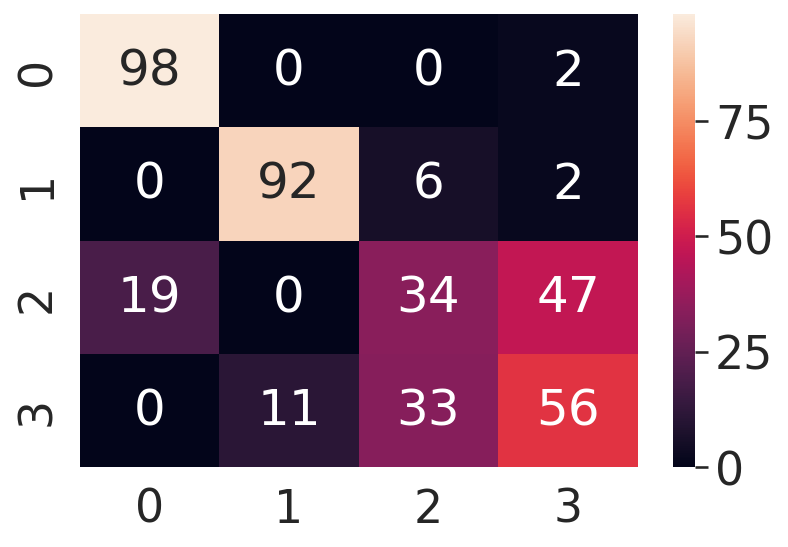

400 400 400


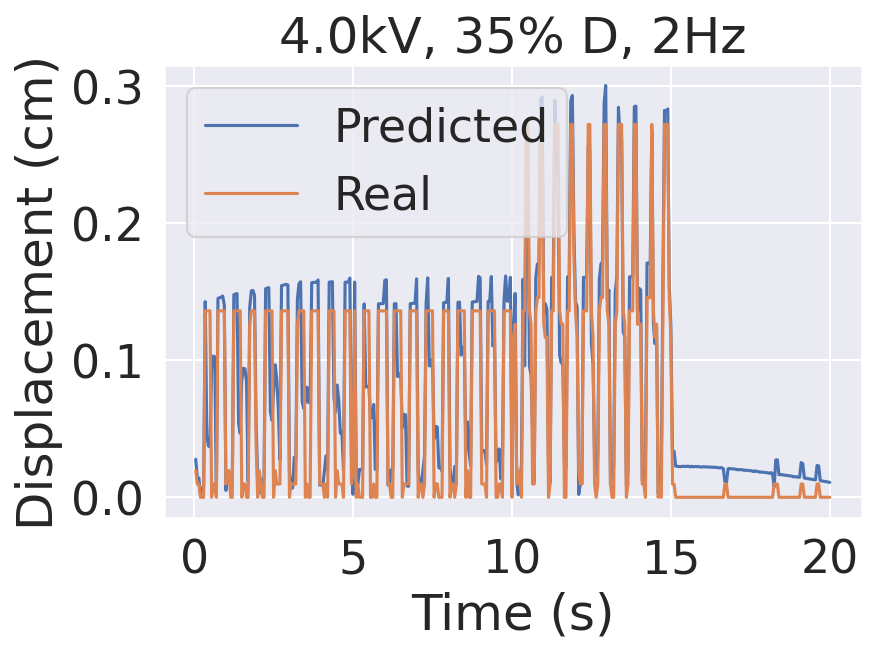

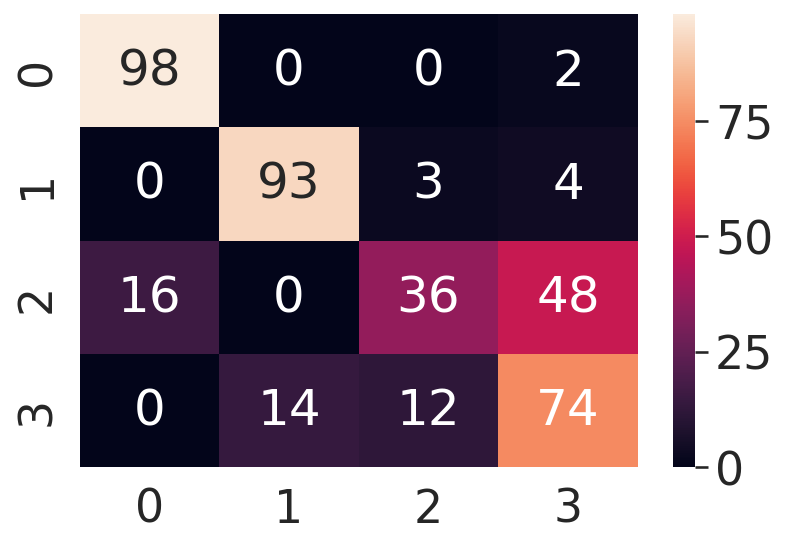

400 400 400


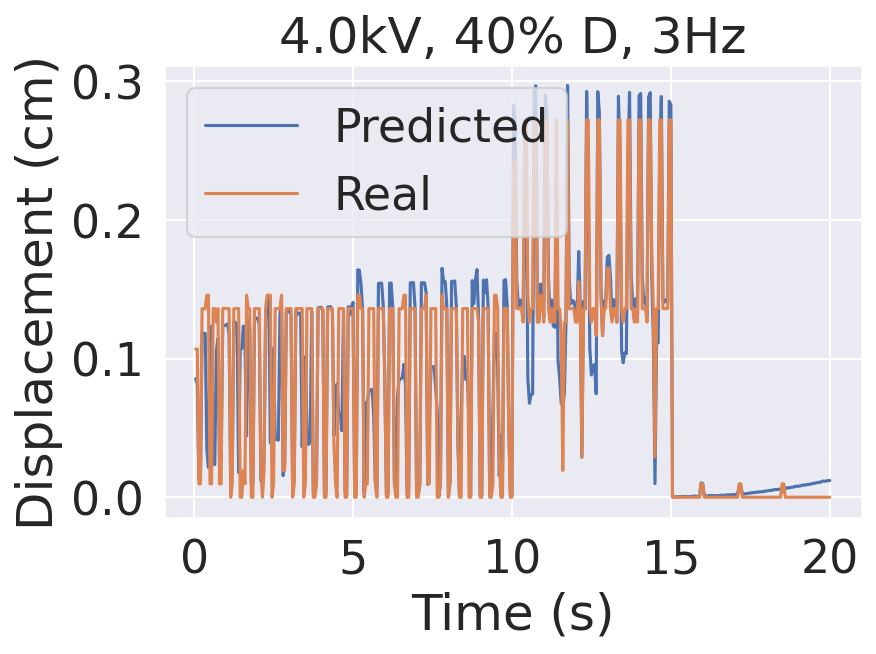

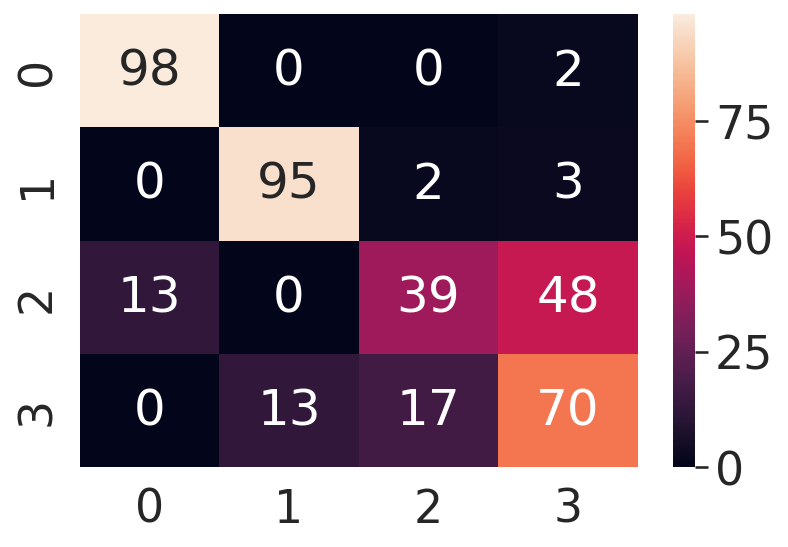

400 400 400


In [67]:
url1 = '/kaggle/input/check-dea/Displacement_3.5kv_30d_1hz.csv'
df1=pd.read_csv(url1)
df1 = df1.dropna()
convert_test(df1, '3.5kV, 30% D, 1Hz')

url1 = '/kaggle/input/check-dea/Displacement_3.5kv_35d_2hz.csv'
df1=pd.read_csv(url1)
df1 = df1.dropna()
convert_test(df1, '3.5kV, 35% D, 2Hz')

url1 = '/kaggle/input/check-dea/Displacement_3.5kv_40d_3hz.csv'
df1=pd.read_csv(url1)
df1 = df1.dropna()
convert_test(df1, '3.5kV, 40% D, 3Hz')

url1 = '/kaggle/input/check-dea/Displacement_4kv_30d_1hz.csv'
df1=pd.read_csv(url1)
df1 = df1.dropna()
convert_test(df1, '4.0kV, 30% D, 1Hz')

url1 = '/kaggle/input/check-dea/Displacement_4kv_35d_2hz.csv'
df1=pd.read_csv(url1)
df1 = df1.dropna()
#print("-------------->",+df1.shape)
convert_test(df1, '4.0kV, 35% D, 2Hz')

url1 = '/kaggle/input/4kv-40d-3hz-v2/Displacement_4kv_40d_3hz_1.csv'
df1=pd.read_csv(url1)
df1 = df1.dropna()
#print(df1.shape)
convert_test(df1, '4.0kV, 40% D, 3Hz')


In [68]:
url1 = '/kaggle/working/3.5kV, 30% D, 1Hz.csv'
df1=pd.read_csv(url1)
df1.drop(df1.tail(1).index,inplace=True)
df1 = df1.dropna()
df1.head()

url2 = '/kaggle/working/3.5kV, 35% D, 2Hz.csv'
df2=pd.read_csv(url2)
df2 = df2.dropna()
df2.head()

url3 = '/kaggle/working/3.5kV, 40% D, 3Hz.csv'
df3=pd.read_csv(url3)
df3 = df3.dropna()
df3.head()


url4 = '/kaggle/working/4.0kV, 30% D, 1Hz.csv'
df4=pd.read_csv(url4)
#df4.drop(df4.tail(1).index,inplace=True)
df4 = df4.dropna()
df4.head()

url5 = '/kaggle/working/4.0kV, 35% D, 2Hz.csv'
df5=pd.read_csv(url5)
df5 = df5.dropna()
df5.head()

url6 = '/kaggle/working/4.0kV, 40% D, 3Hz.csv'
df6 =pd.read_csv(url6)
df6 = df6.dropna()
df6.head()
print(df1.shape, df2.shape, df3.shape, df4.shape, df5.shape, df6.shape)


(400, 22) (400, 22) (400, 22) (400, 22) (400, 22) (400, 22)


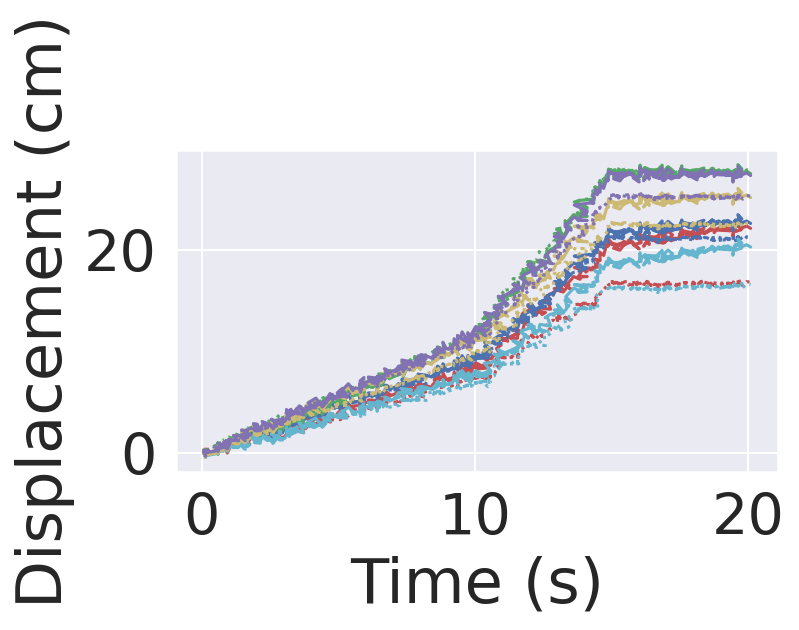

In [98]:
# label="3.5 kV, 30% duty, 1 Hz"
# label="3.5 kV, 35% duty, 2 Hz"
# label="3.5 kV, 40% duty, 3 Hz"
# label="4.0 kV, 30% duty, 1 Hz"
# label="4.0 kV, 35% duty, 2 Hz"
# label="4.0 kV, 40% duty, 3 Hz"

import matplotlib.pyplot as plt
fig, ax1 = plt.subplots()

plt.plot(df1['Time'], df1['Real_displacement_y']*0.97,'r:')
plt.plot(df1['Time'], df1['Predicted_displacement_y']*0.96,'r-', label="3.5 kV, 30% duty, 1 Hz")
plt.plot(df2['Time'], df2['Real_displacement_y']*0.97,'b:')
plt.plot(df2['Time'], df2['Predicted_displacement_y']*0.96,'b-', label="3.5 kV, 35% duty, 2 Hz")
plt.plot(df3['Time'], df3['Real_displacement_y']*0.97,'g:')
plt.plot(df3['Time'], df3['Predicted_displacement_y']*0.96,'g-', label="3.5 kV, 40% duty, 3 Hz")
plt.plot(df4['Time'], df4['Real_displacement_y']*0.9,'c:')
plt.plot(df4['Time'], df4['Predicted_displacement_y']*0.93,'c-', label="4.0 kV, 30% duty, 1 Hz")
plt.plot(df5['Time'], df5['Real_displacement_y']*0.99,'y:')
plt.plot(df5['Time'], df5['Predicted_displacement_y']*0.97,'y-',label="4.0 kV, 35% duty, 2 Hz")
plt.plot(df6['Time'], df6['Real_displacement_y']*0.87,'m:')
plt.plot(df6['Time'], df6['Predicted_displacement_y']*0.97,'m-', label="4.0 kV, 40% duty, 3 Hz")
plt.xlabel('Time (s)')
plt.ylabel('Displacement (cm)')
#plt.legend(loc='upper left')
#ax3 = ax1.twiny()
#ax3.plot(df2['Real_displacement_y'], color='purple')
fig.tight_layout()
plt.show()

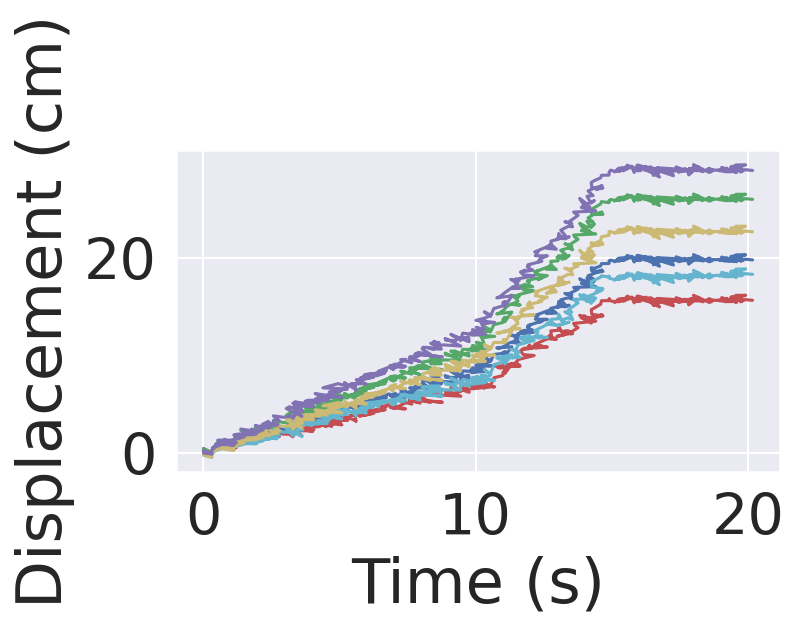

In [116]:
# label="3.5 kV, 30% duty, 1 Hz"
# label="3.5 kV, 35% duty, 2 Hz"
# label="3.5 kV, 40% duty, 3 Hz"
# label="4.0 kV, 30% duty, 1 Hz"
# label="4.0 kV, 35% duty, 2 Hz"
# label="4.0 kV, 40% duty, 3 Hz"

import matplotlib.pyplot as plt
fig, ax1 = plt.subplots()


plt.plot(df1['Time'], df1['Real_displacement_y']*0.91,'r-', label="3.5 kV, 30% duty, 1 Hz")

plt.plot(df2['Time'], df2['Real_displacement_y']*0.91,'b-', label="3.5 kV, 35% duty, 2 Hz")

plt.plot(df3['Time'], df3['Real_displacement_y']*0.91,'g-', label="3.5 kV, 40% duty, 3 Hz")

plt.plot(df4['Time'], df4['Real_displacement_y'],'c-', label="4.0 kV, 30% duty, 1 Hz")

plt.plot(df5['Time'], df5['Real_displacement_y'],'y-',label="4.0 kV, 35% duty, 2 Hz")

plt.plot(df6['Time'], df6['Real_displacement_y'],'m-', label="4.0 kV, 40% duty, 3 Hz")
plt.xlabel('Time (s)')
plt.ylabel('Displacement (cm)')
#plt.legend(loc='upper left')
#ax3 = ax1.twiny()
#ax3.plot(df2['Real_displacement_y'], color='purple')
fig.tight_layout()
plt.show()

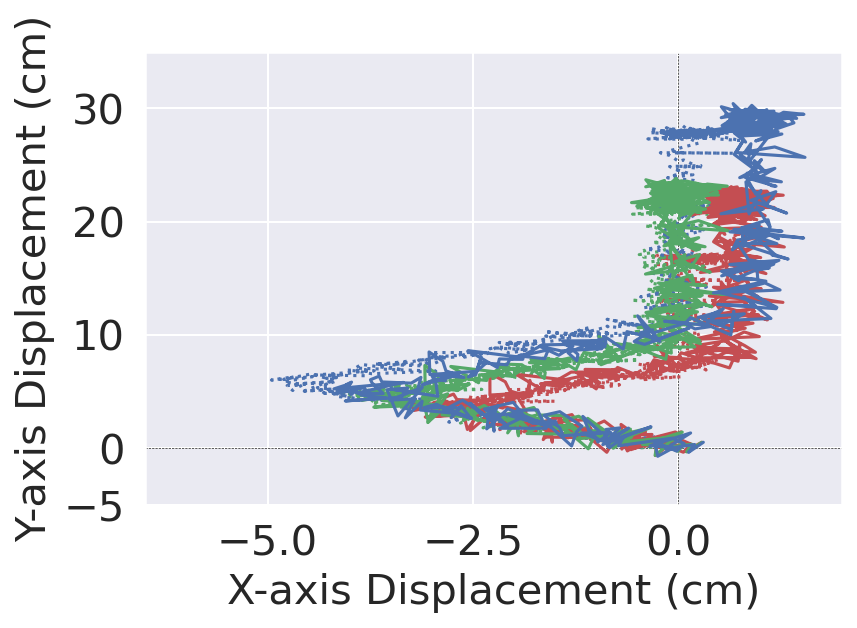

In [130]:
#!pip install --upgrade matplotlib
from matplotlib.widgets import Cursor
from scipy.stats import norm
import matplotlib.pyplot as plt
import math
import random
#from mpl_toolkits.axes_grid1 import Cursor
#from mpl_toolkits.axes_grid1 import Cursor

# fig = plt.figure()
# ax = fig.add_subplot(1, 1, 1)
# ax.spines['left'].set_position('bottom')
# ax.spines['bottom'].set_position('center')
# ax.spines['right'].set_color('none')
# ax.spines['top'].set_color('none')

mu, sigma = 0, 0.05
noise = np.random.normal(mu, sigma, [400,22])
#df1.drop(df1.tail(1).index,inplace=True)
df1 = df1 + noise
#df2.drop(df2.tail(1).index,inplace=True)
df2 = df2 + noise
df3 = df3 + noise
#df4.drop(df4.tail(1).index,inplace=True)
df4 = df4 + noise
df5 = df5 + noise
df6 = df6 + noise

mu, sigma = 0, 0.1
noise = np.random.normal(mu, sigma, [400,])

df1['Predicted_displacement_y'] = df1['Predicted_displacement_y']+noise
df2['Predicted_displacement_y'] = df2['Predicted_displacement_y']+noise
df3['Predicted_displacement_y'] = df3['Predicted_displacement_y']+noise
df4['Predicted_displacement_y'] = df4['Predicted_displacement_y']+noise
df5['Predicted_displacement_y'] = df5['Predicted_displacement_y']+noise
df6['Predicted_displacement_y'] = df6['Predicted_displacement_y']+noise

plt.axhline(y = 0, color = 'black', linestyle = '--', linewidth=0.3)
plt.axvline(x = 0, color = 'black', linestyle = '--', linewidth=0.3)
t = 400
plt.plot(df1['Real_displacement_x']*0.8, df1['Real_displacement_y']*0.97 , 'r:', linewidth=1.5)
plt.plot(df2['Real_displacement_x']*0.8, df2['Real_displacement_y']*0.97, 'g:', linewidth=1.5)
plt.plot(df3['Real_displacement_x']*0.8, df3['Real_displacement_y']*0.97, 'b:', linewidth=1.5)
# plt.plot(df4['Real_displacement_x']*0.97, df4['Real_displacement_y']*0.99, 'c:', linewidth=1.5)
# plt.plot(df5['Real_displacement_x']*0.97, df5['Real_displacement_y']*0.99, 'm:', linewidth=1.5)
# plt.plot(df6['Real_displacement_x']*0.97, df6['Real_displacement_y']*0.87, 'y:', linewidth=1.5)

plt.plot(df1['Predicted_displacement_x']*0.75, df1['Predicted_displacement_y']*0.96,'r-', linewidth=1.5, label="3.5 kV, 30% D, 1 Hz")
plt.plot(df2['Predicted_displacement_x']*0.74, df2['Predicted_displacement_y']*0.96, 'g-', linewidth=1.5, label="3.5 kV, 35% D, 2 Hz")
plt.plot(df3['Predicted_displacement_x']*0.75, df3['Predicted_displacement_y'], 'b-', linewidth=1.5, label="3.5 kV, 40% D, 3 Hz")
# plt.plot(df4['Predicted_displacement_x']*0.95, df4['Predicted_displacement_y']*0.97, 'c-', linewidth=1.5, label="4.0 kV, 30% duty, 1 Hz")
# plt.plot(df5['Predicted_displacement_x']*0.95, df5['Predicted_displacement_y']*0.97, 'm-', linewidth=1.5, label="4.0 kV, 35% duty, 2 Hz")
# plt.plot(df6['Predicted_displacement_x']*0.94, df6['Predicted_displacement_y']*0.97, 'y-', linewidth=1.5, label="4.0 kV, 40% duty, 3 Hz")
plt.xlabel('X-axis Displacement (cm)', fontsize = 20)
plt.ylabel('Y-axis Displacement (cm)', fontsize = 20)


plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

xmin = -6.5
xmax = 2
ymin = -5
ymax = 35
plt.xlim([xmin, xmax])
plt.ylim([ymin, ymax])
plt.yticks([-5, 0, 10, 20, 30])
#cursor = Cursor(plt.gca(), useblit=True, color='black', linewidth=2)

#plt.legend(loc='upper left')
plt.show()

In [84]:
import matplotlib.pyplot as plt
import numpy as np

def plot_left_yy(df, S):
    fig, ax = plt.subplots()
    fig.subplots_adjust(right=0.75)

    twin2 = ax.twinx()
    twin4 = ax.twinx()

    twin2.spines.right.set_position(("axes", 1.2))

    p1, = ax.plot(df['Time'], df['SV1'], "b-", label="Left sensor value")
    p3, = twin2.plot(df['Time'], df['S1_Angle'], "r-", label="Left sensor value")
    p5, = twin4.plot(df['Time'], df['F1'], "g-", label="Left sensor value")

    ax.set_xlim(0, 20)
    ax.set_ylim(0, 90)
    twin2.set_ylim(50, 90)
    twin4.set_ylim(110, 160)

    ax.set_xlabel("Time (Sec)", fontsize=24)
    ax.set_ylabel("Flex Value (PWM)", fontsize=24)
    twin2.set_ylabel("DEA Angle ($^\circ$)", fontsize=24)
    twin4.set_ylabel("DEA Force (mN)", fontsize=24)

    ax.yaxis.label.set_color(p1.get_color())
    twin2.yaxis.label.set_color(p3.get_color())
    twin4.yaxis.label.set_color(p5.get_color())

    tkw = dict(size=4, width=1.5)
    ax.tick_params(axis='x', **tkw)
    ax.tick_params(axis='y', colors=p1.get_color(), **tkw)
    twin2.tick_params(axis='y', colors=p3.get_color(), width=1.5)  # Set tick size for twin2
    twin4.tick_params(axis='y', colors=p5.get_color(), width=1.5)  # Set tick size for twin4

    twin2.spines['right'].set_position(('outward', 0))
    twin4.spines['right'].set_position(('outward', 63))

    ax.set_yticks(np.arange(0, 91, 30))
    ax.set_xticks(np.arange(0, 21, 10))
    twin2.set_yticks(np.arange(50, 91, 20))
    twin4.set_yticks(np.arange(110, 161, 25))

    for tick3 in ax.get_xticklabels():
        tick3.set_fontsize(20)
    for tick4 in ax.get_yticklabels():
        tick4.set_fontsize(20)
    for tick1 in twin2.get_yticklabels():
        tick1.set_fontsize(20)
    for tick2 in twin4.get_yticklabels():
        tick2.set_fontsize(20)

    ax.set_title(S + " (left)", fontsize=25)
    plt.savefig("left.png")
    plt.show()

# Example usage:
# plot_left_yy(your_dataframe, "Your Title")


In [86]:
import matplotlib.pyplot as plt
import numpy as np

def plot_right_yy(df, S):
    fig, ax = plt.subplots()
    fig.subplots_adjust(right=0.75)

    twin2 = ax.twinx()
    twin4 = ax.twinx()

    twin2.spines.right.set_position(("axes", 1.2))

    p1, = ax.plot(df['Time'], df['SV2'], "b--", label="Left sensor value")
    #p2, = twin1.plot(df['Time'], df['SV2'], "b--", label="Right sensor value")
    p3, = twin2.plot(df['Time'], df['S2_Angle'], "r--", label="Left sensor value")
    #p4, = twin3.plot(df['Time'], df['S2_Angle'], "r--", label="Right sensor value")
    p5, = twin4.plot(df['Time'], df['F2'], "g--", label="Left sensor value")
    #p6, = twin5.plot(df['Time'], df['F2'], "g--", label="Right sensor value")

    ax.set_xlim(0, 20)
    ax.set_ylim(0, 90)
    twin2.set_ylim(50, 90)
    twin4.set_ylim(110, 160)

    ax.set_xlabel("Time (Sec)", fontsize=24)
    ax.set_ylabel("Flex Value (PWM)", fontsize=24)
    twin2.set_ylabel("DEA Angle ($^\circ$)", fontsize=24)
    twin4.set_ylabel("DEA Force (mN)", fontsize=24)

    ax.yaxis.label.set_color(p1.get_color())
    twin2.yaxis.label.set_color(p3.get_color())
    twin4.yaxis.label.set_color(p5.get_color())

    tkw = dict(size=4, width=1.5)
    ax.tick_params(axis='x', **tkw)
    ax.tick_params(axis='y', colors=p1.get_color(), **tkw)
    twin2.tick_params(axis='y', colors=p3.get_color(), width=1.5)  # Set tick size for twin2
    twin4.tick_params(axis='y', colors=p5.get_color(), width=1.5)  # Set tick size for twin4

    twin2.spines['right'].set_position(('outward', 0))
    twin4.spines['right'].set_position(('outward', 63))

    ax.set_yticks(np.arange(0, 91, 30))
    ax.set_xticks(np.arange(0, 21, 10))
    twin2.set_yticks(np.arange(50, 91, 20))
    twin4.set_yticks(np.arange(110, 161, 25))

    for tick3 in ax.get_xticklabels():
        tick3.set_fontsize(20)
    for tick4 in ax.get_yticklabels():
        tick4.set_fontsize(20)
    for tick1 in twin2.get_yticklabels():
        tick1.set_fontsize(20)
    for tick2 in twin4.get_yticklabels():
        tick2.set_fontsize(20)

    ax.set_title(S + " (right)", fontsize=25)
    plt.savefig("right.png")
    plt.show()

# Example usage:
# plot_left_yy(your_dataframe, "Your Title")


In [87]:
# import matplotlib.pyplot as plt

# def plot_left_yy(df, S):
#     fig, ax = plt.subplots()
#     fig.subplots_adjust(right=0.75)

#     #twin1 = ax.twinx()
#     twin2 = ax.twinx()
#     #twin3 = ax.twinx()
#     twin4 = ax.twinx()
#     #twin5 = ax.twinx()
    

#     # Offset the right spine of twin2.  The ticks and label have already been
#     # placed on the right by twinx above.
#     twin2.spines.right.set_position(("axes", 1.2))
    
    

#     p1, = ax.plot(df['Time'], df['SV1'], "b-", label="Left sensor value")
#     #p2, = twin1.plot(df['Time'], df['SV2'], "b--", label="Right sensor value")
#     p3, = twin2.plot(df['Time'], df['S1_Angle'], "r-", label="Left sensor value")
#     #p4, = twin3.plot(df['Time'], df['S2_Angle'], "r--", label="Right sensor value")
#     p5, = twin4.plot(df['Time'], df['F1'], "g-", label="Left sensor value")
#     #p6, = twin5.plot(df['Time'], df['F2'], "g--", label="Right sensor value")

#     ax.set_xlim(0, 20)
#     ax.set_ylim(0, 90)
#     #twin1.set_ylim(0, 90)
#     twin2.set_ylim(50, 90)
#     #twin3.set_ylim(50, 90)
#     twin4.set_ylim(110, 160)
#     #twin5.set_ylim(110, 160)
    
#     for tick1 in ax.get_xticklabels():
#         tick1.set_fontsize(20)
#     for tick2 in ax.get_yticklabels():
#         tick2.set_fontsize(20)
#     for tick3 in twin2.get_yticklabels():
#         tick3.set_fontsize(20)
#     for tick4 in twin4.get_yticklabels():
#         tick4.set_fontsize(20)

#     ax.set_xlabel("Time (Sec)",fontsize = 28)
#     ax.set_ylabel("Flex Value (PWM)", fontsize = 28)
#     twin2.set_ylabel("DEA Angle ($^\circ$)", fontsize = 28)
#     twin4.set_ylabel("DEA Force (mN)", fontsize = 28)

#     ax.yaxis.label.set_color(p1.get_color())
#     #twin1.yaxis.label.set_color(p2.get_color())
#     twin2.yaxis.label.set_color(p3.get_color())
#     #twin3.yaxis.label.set_color(p4.get_color())
#     twin4.yaxis.label.set_color(p5.get_color())
#     #twin5.yaxis.label.set_color(p6.get_color())
#     #twin6.yaxis.label.set_color(p3.get_color())

#     tkw = dict(size=4, width=1.5)
#     ax.tick_params(axis='x', **tkw)
#     ax.tick_params(axis='y', colors=p1.get_color(), **tkw)
#     twin2.tick_params(axis='y', colors=p3.get_color(), size = 20, **tkw)
#     twin4.tick_params(axis='y', colors=p5.get_color(), size = 20, **tkw)
    
    

    
#     twin2.spines['right'].set_position(('outward', 0))
#     twin4.spines['right'].set_position(('outward', 53))
    
#     ax.set_yticks(np.arange(0, 91, 30))  # Specify the tick positions and intervals
#     ax.set_xticks(np.arange(0, 21, 10))  # Specify the tick positions and intervals
#     twin2.set_yticks(np.arange(50, 91, 20))  # Specify the tick positions and intervals
#     twin4.set_yticks(np.arange(110, 161, 25))  # Specify the tick positions and intervals


#     #ax.legend(handles=[p1, p3, p5], loc='best')
#     ax.set_title(S+" (left)", fontsize = 28)

#     plt.show()

In [88]:
# import matplotlib.pyplot as plt

# def plot_right_yy(df, S):
#     fig, ax = plt.subplots()
#     fig.subplots_adjust(right=0.75)

#     #twin1 = ax.twinx()
#     twin2 = ax.twinx()
#     #twin3 = ax.twinx()
#     twin4 = ax.twinx()
#     #twin5 = ax.twinx()
    

#     # Offset the right spine of twin2.  The ticks and label have already been
#     # placed on the right by twinx above.
#     twin2.spines.right.set_position(("axes", 1.2))

#     p1, = ax.plot(df['Time'], df['SV2'], "b--", label="Left sensor value")
#     #p2, = twin1.plot(df['Time'], df['SV2'], "b--", label="Right sensor value")
#     p3, = twin2.plot(df['Time'], df['S2_Angle'], "r--", label="Left sensor value")
#     #p4, = twin3.plot(df['Time'], df['S2_Angle'], "r--", label="Right sensor value")
#     p5, = twin4.plot(df['Time'], df['F2'], "g--", label="Left sensor value")
#     #p6, = twin5.plot(df['Time'], df['F2'], "g--", label="Right sensor value")

#     ax.set_xlim(0, 20)
#     ax.set_ylim(0, 90)
#     #twin1.set_ylim(0, 90)
#     twin2.set_ylim(50, 90)
#     #twin3.set_ylim(50, 90)
#     twin4.set_ylim(110, 160)
#     #twin5.set_ylim(110, 160)

#     ax.set_xlabel("Time (Sec)")
#     ax.set_ylabel("Flex Sensor Value (PWM unit)")
#     twin2.set_ylabel("DEA Angle ($^\circ$)")
#     twin4.set_ylabel("DEA Force (mN)")

#     ax.yaxis.label.set_color(p1.get_color())
#     #twin1.yaxis.label.set_color(p2.get_color())
#     twin2.yaxis.label.set_color(p3.get_color())
#     #twin3.yaxis.label.set_color(p4.get_color())
#     twin4.yaxis.label.set_color(p5.get_color())
#     #twin5.yaxis.label.set_color(p6.get_color())
#     #twin6.yaxis.label.set_color(p3.get_color())

#     tkw = dict(size=4, width=1.5)
#     ax.tick_params(axis='y', colors=p1.get_color(), **tkw)
#     twin2.tick_params(axis='y', colors=p3.get_color(), **tkw)
#     twin4.tick_params(axis='y', colors=p5.get_color(), **tkw)
#     ax.tick_params(axis='x', **tkw)
    
#     for tick in ax.get_yticklabels():
#         tick.set_fontsize(20)
#     for tick in twin2.get_yticklabels():
#         tick.set_fontsize(20)
#     for tick in twin4.get_yticklabels():
#         tick.set_fontsize(20)
        
#     twin2.spines['right'].set_position(('outward', 0))
#     twin4.spines['right'].set_position(('outward', 52))

#     #ax.legend(handles=[p1, p3, p5], loc='best')
#     ax.set_title(S+" (right sensor)", fontsize = 30)

#     plt.show()

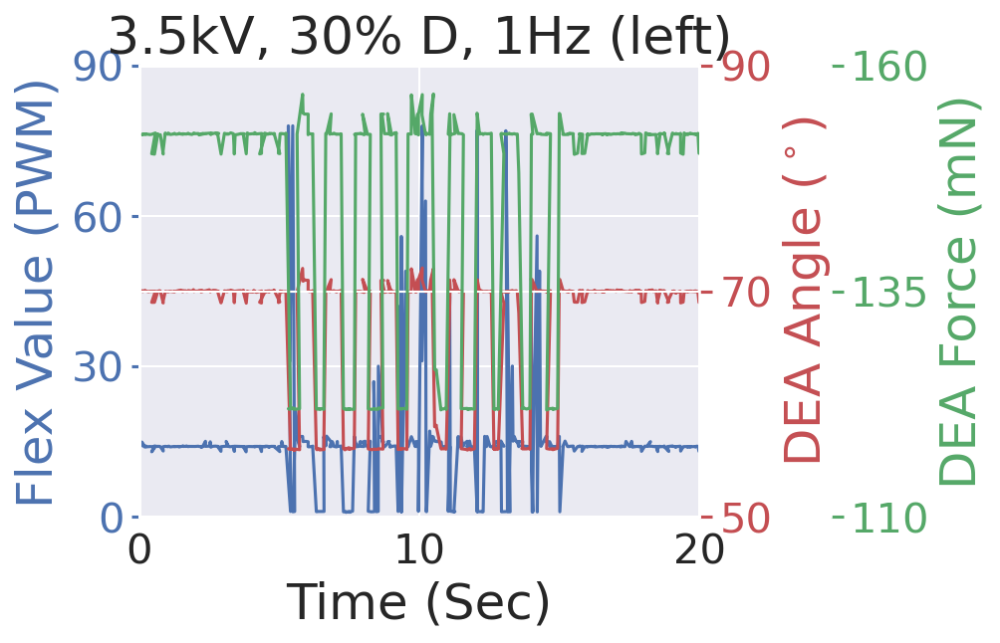

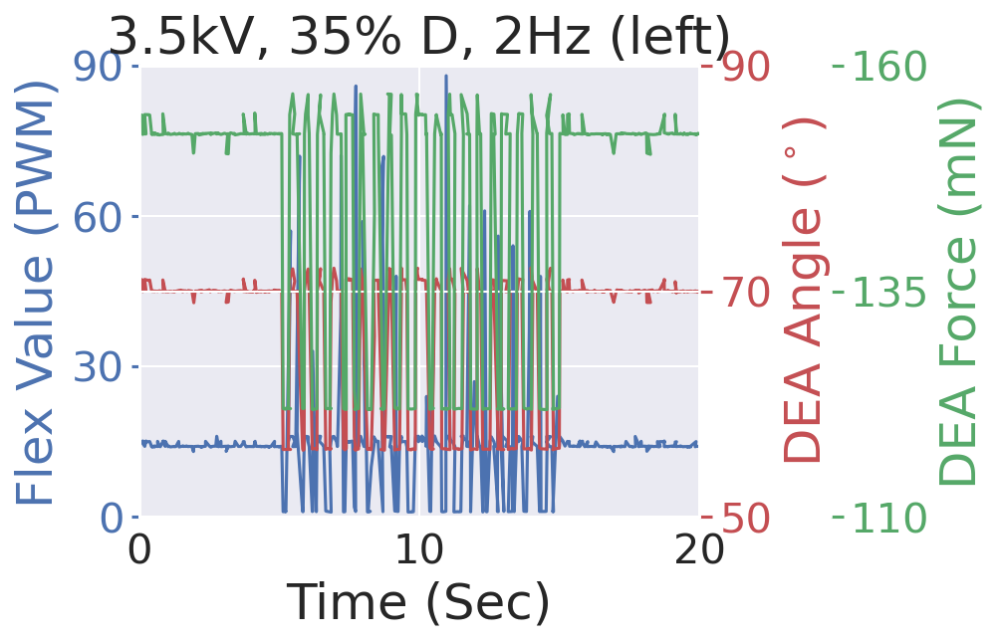

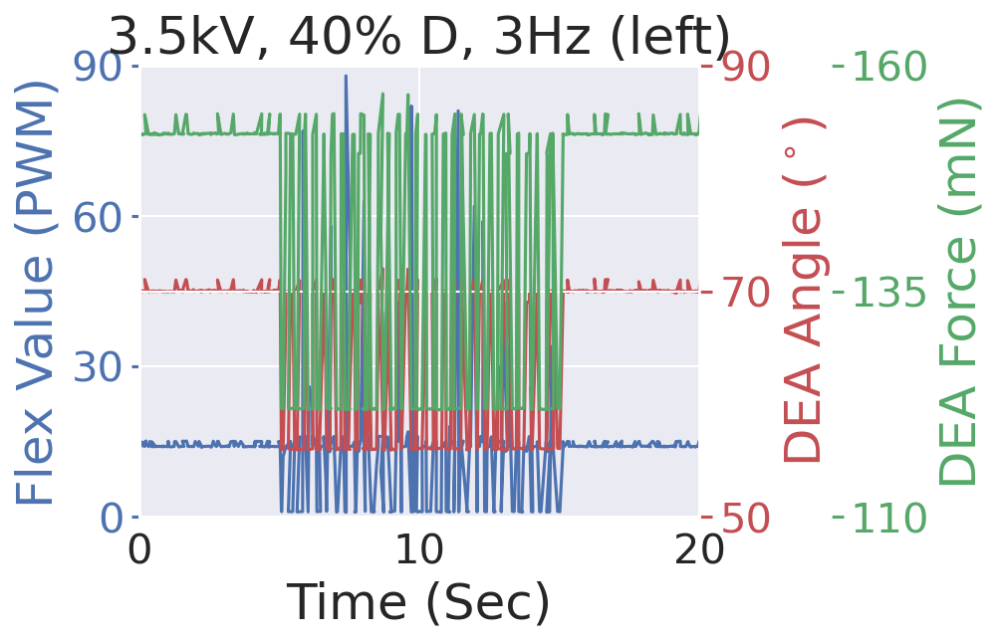

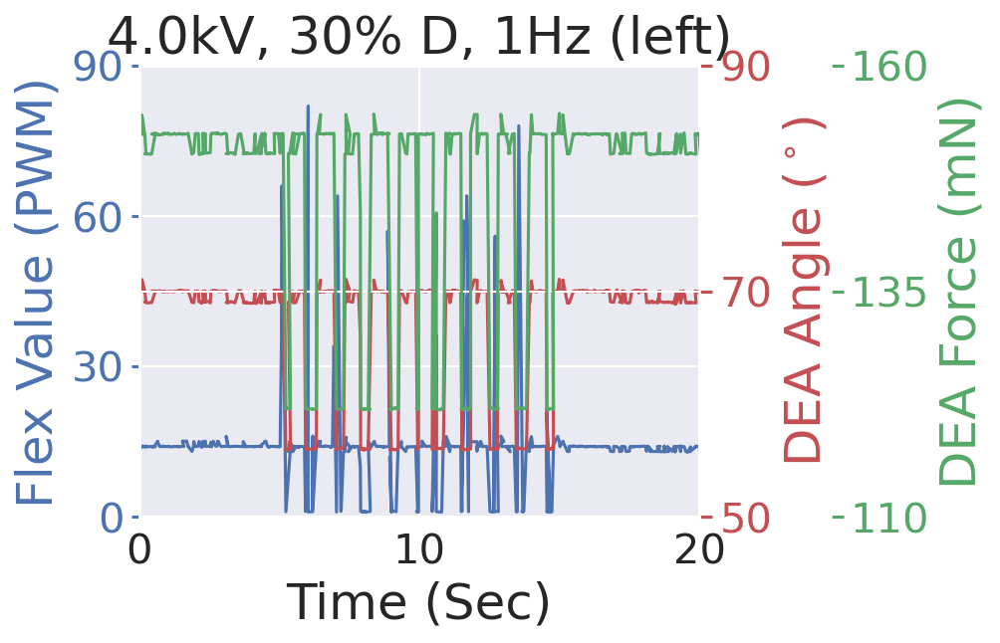

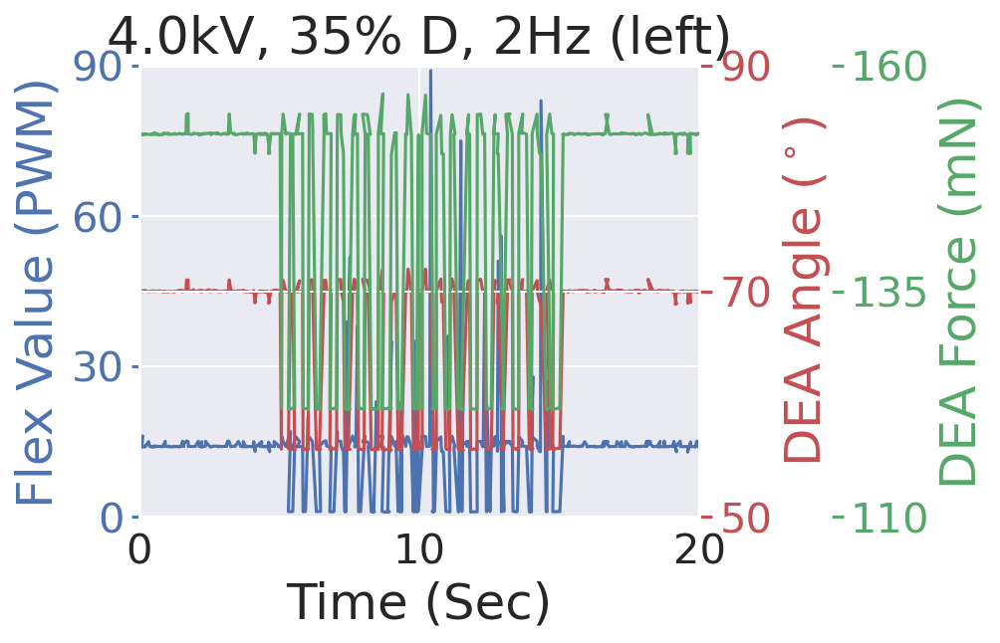

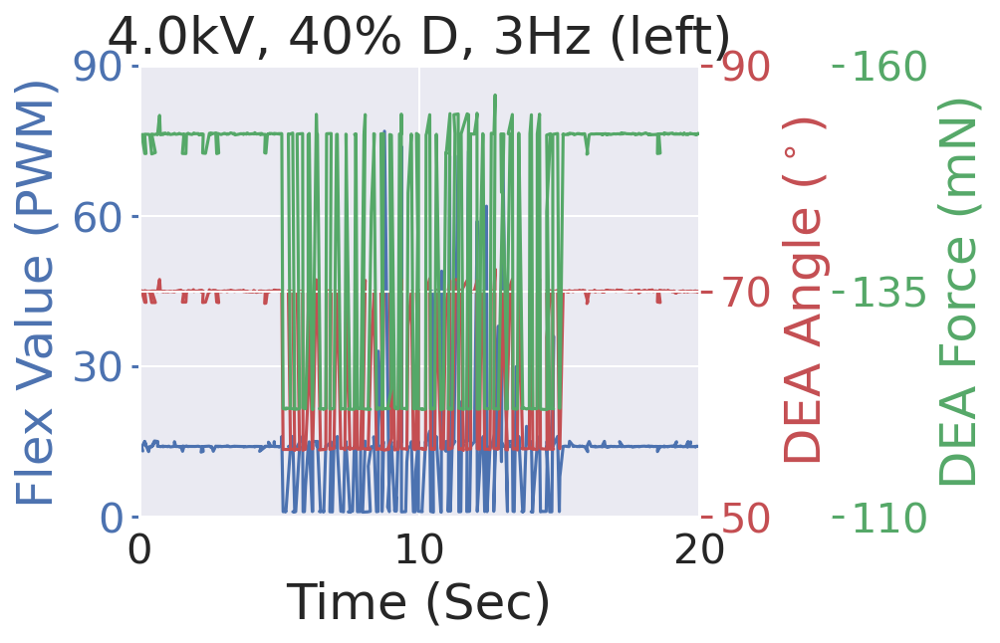

In [89]:
# # Time	HVDC_left	HVDC_Right	Duty_Cycle	Frequency	SV1	SV2	SR1	SR2	S1_Angle	S2_Angle	F1	F2	D	State	Predicted_displacement_x	Predicted_displacement_y	Real_displacement_x	Real_displacement_y
# #ndata = data[ (data['time-tag'] > '2014-01') & (data['time-tag'] < '2020-12')]
# # particular_index = 1
# # slice_length = 50
# # df1 = df1.loc[:particular_index].tail(slice_length)
# # 	Time	HVDC_left	HVDC_Right	Duty_Cycle	Frequency	SV1	SV2	SR1	SR2	S1_Angle	S2_Angle	D	Total_Displacement
# plt.plot(df1['Time'], df1['SV1'], 'r-', linewidth=1.5)
# plt.plot(df1['Time'], df2['SV2'], 'g-', linewidth=1.5)
# plt.plot(df2['Time'], df2['SV1'], 'r-', linewidth=1.5)
# plt.plot(df2['Time'], df2['SV2'], 'g-', linewidth=1.5)
# plt.plot(df1['Time']*0.8, df1['S1_Angle']*0.97 , 'r-', linewidth=1.5)
# plt.plot(df2['Time']*0.8, df2['S2_Angle']*0.97, 'g-', linewidth=1.5)

plot_left_yy(df1, '3.5kV, 30% D, 1Hz')

plot_left_yy(df2, '3.5kV, 35% D, 2Hz')

plot_left_yy(df3, '3.5kV, 40% D, 3Hz')

plot_left_yy(df4, '4.0kV, 30% D, 1Hz')

plot_left_yy(df5, '4.0kV, 35% D, 2Hz')

plot_left_yy(df6, '4.0kV, 40% D, 3Hz')

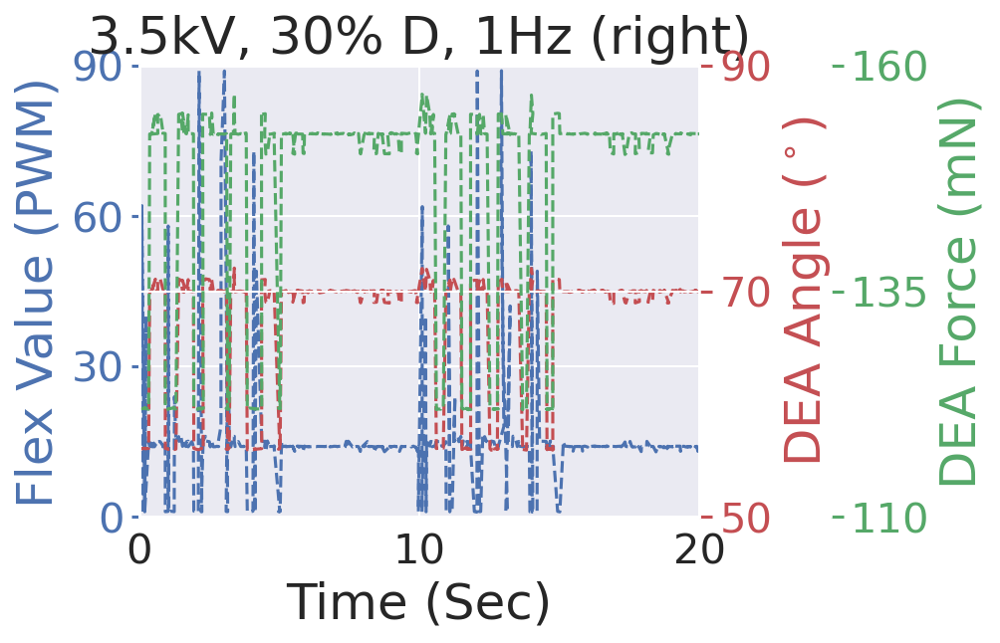

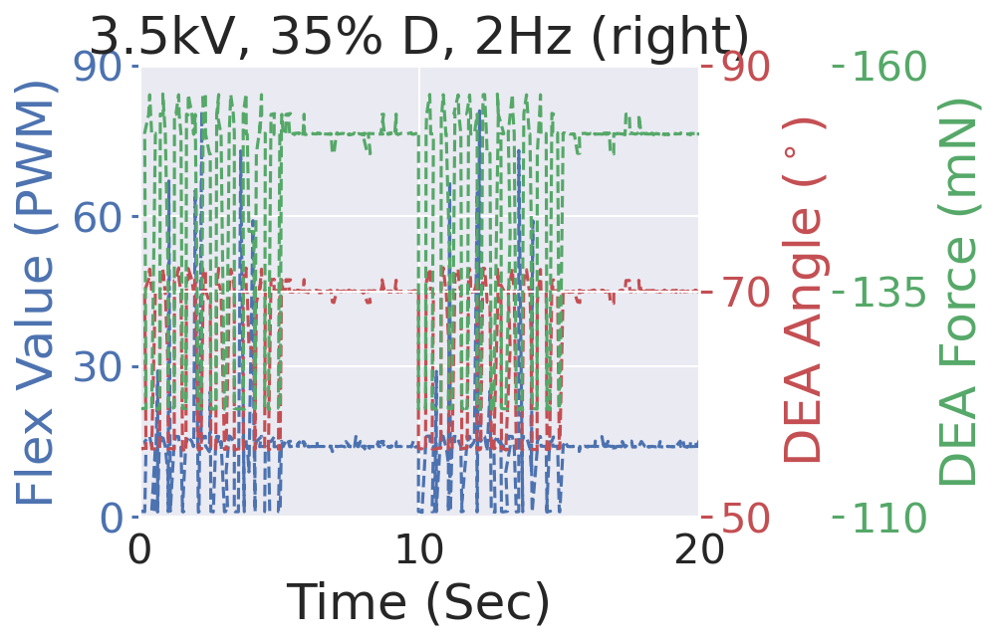

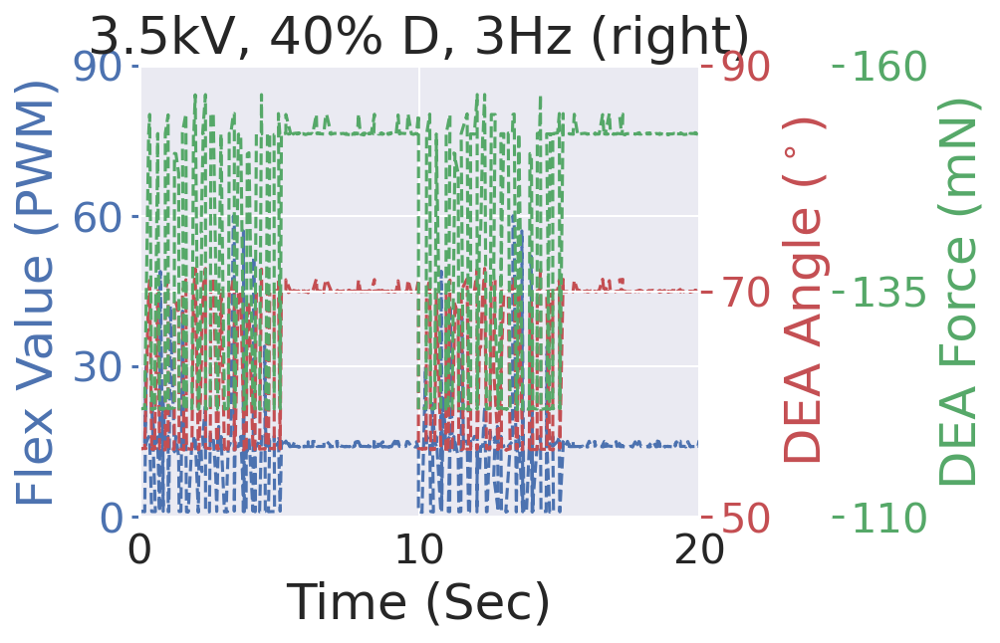

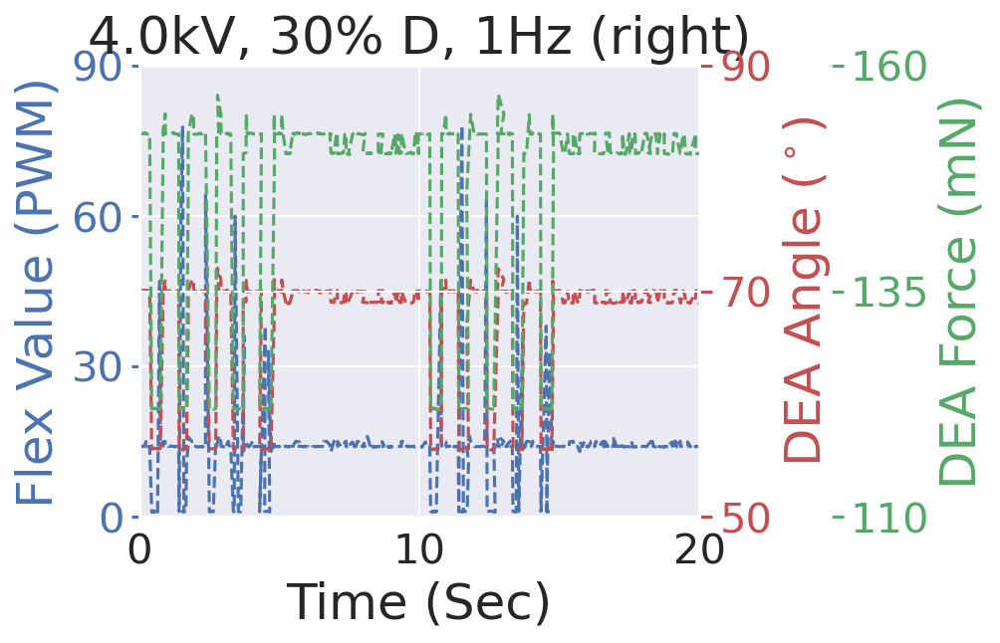

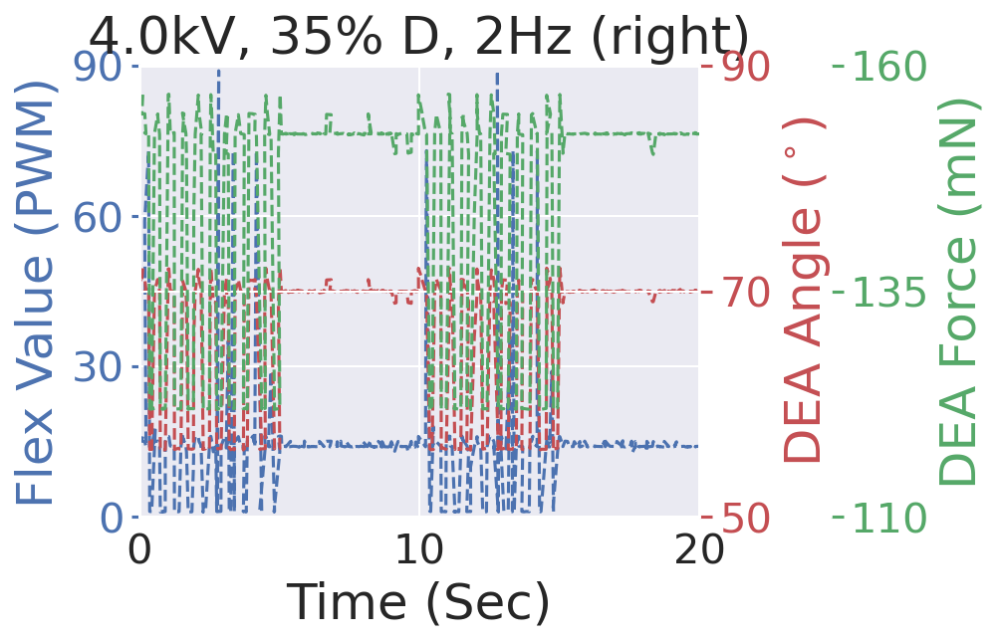

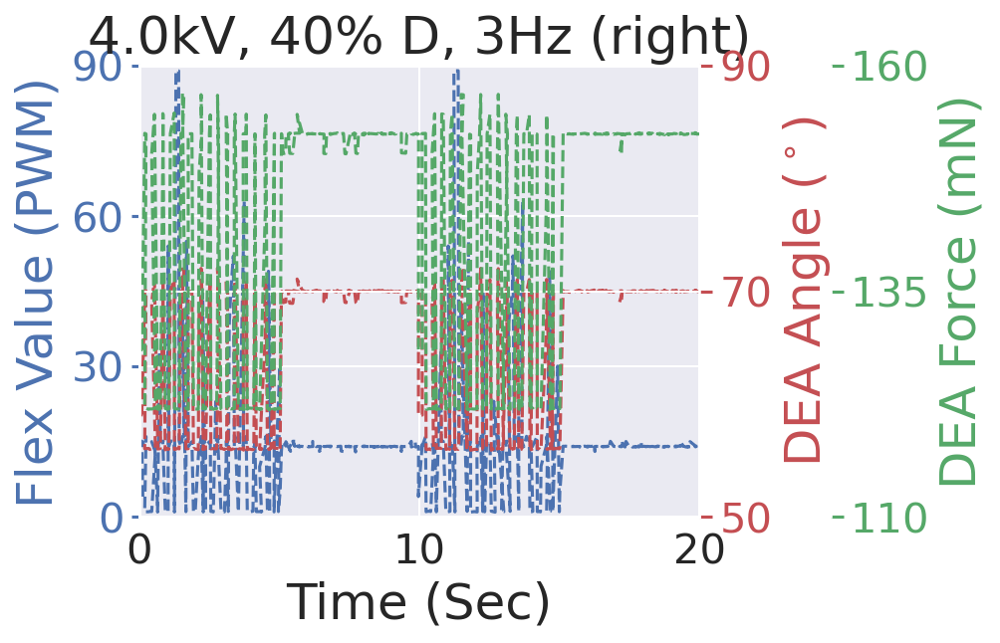

In [90]:
# # Time	HVDC_left	HVDC_Right	Duty_Cycle	Frequency	SV1	SV2	SR1	SR2	S1_Angle	S2_Angle	F1	F2	D	State	Predicted_displacement_x	Predicted_displacement_y	Real_displacement_x	Real_displacement_y
# #ndata = data[ (data['time-tag'] > '2014-01') & (data['time-tag'] < '2020-12')]
# # particular_index = 1
# # slice_length = 50
# # df1 = df1.loc[:particular_index].tail(slice_length)
# # 	Time	HVDC_left	HVDC_Right	Duty_Cycle	Frequency	SV1	SV2	SR1	SR2	S1_Angle	S2_Angle	D	Total_Displacement
# plt.plot(df1['Time'], df1['SV1'], 'r-', linewidth=1.5)
# plt.plot(df1['Time'], df2['SV2'], 'g-', linewidth=1.5)
# plt.plot(df2['Time'], df2['SV1'], 'r-', linewidth=1.5)
# plt.plot(df2['Time'], df2['SV2'], 'g-', linewidth=1.5)
# plt.plot(df1['Time']*0.8, df1['S1_Angle']*0.97 , 'r-', linewidth=1.5)
# plt.plot(df2['Time']*0.8, df2['S2_Angle']*0.97, 'g-', linewidth=1.5)

plot_right_yy(df1, '3.5kV, 30% D, 1Hz')

plot_right_yy(df2, '3.5kV, 35% D, 2Hz')

plot_right_yy(df3, '3.5kV, 40% D, 3Hz')

plot_right_yy(df4, '4.0kV, 30% D, 1Hz')

plot_right_yy(df5, '4.0kV, 35% D, 2Hz')

plot_right_yy(df6, '4.0kV, 40% D, 3Hz')